In [290]:
import random
random.seed(24)
random_seed = 24

In [5]:
# Importing libraries
import pandas as pd
import warnings 
warnings.filterwarnings('ignore')

data = pd.DataFrame()
for i in range(23,28):
    file_name = "savedrecs" + "(" + str(i) + ")" + ".txt"
    file = pd.read_csv(file_name, sep="\t")
    data = pd.concat([data,file],axis=0)
    
    
data.reset_index(drop = True, inplace = True)

In [6]:
data.head(2)

,PT,DT,AU,AA,ED,CA,SP,PN,AE,TI,...,SN,BN,NR,PG,DI,OA,HC,HP,DA,UT
0,J,NaN,Yu-Xiao Wang; Yue Xin; Jun-Yi Yin; Xiao-Jun Hu...,NaN,NaN,NaN,NaN,NaN,NaN,Revealing the architecture and solution proper...,...,0308-8146,NaN,NaN,NaN,10.1016/j.foodchem.2021.130772,NaN,NaN,NaN,NaN,FSTA:2022-02-Jq1296
1,J,NaN,Yu-Xiao Wang; Yue Xin; Xiao-Jun Huang; Jun-Yi ...,NaN,NaN,NaN,NaN,NaN,NaN,A branched galactoglucan with flexible chains ...,...,0308-8146,NaN,NaN,NaN,10.1016/j.foodchem.2021.130738,NaN,NaN,NaN,NaN,FSTA:2022-01-Aj0385


Only need AB - Abstract, SO  - journal name, TI - article title, AU - authors

In [7]:
food_df = data[["AU", "SO", "TI", "AB"]]
food_df

,AU,SO,TI,AB
0,Yu-Xiao Wang; Yue Xin; Jun-Yi Yin; Xiao-Jun Hu...,Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
1,Yu-Xiao Wang; Yue Xin; Xiao-Jun Huang; Jun-Yi ...,Food Chemistry,A branched galactoglucan with flexible chains ...,A homogeneous galactoglucan was purified from ...
2,Yu-Xiao Wang; Ting Zhang; Jun-Yi Yin; Xiao-Jun...,Food Hydrocolloids,Structural characterization and rheological pr...,A homogeneous beta-glucan (JHMP-70) was obtain...
3,Yu-Xin Gu; Tian-Ci Yan; Zi-Xuan Yue; Min-Hui L...,Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,A novel dispersive micro-solid-phase extractio...
4,Yu-Xue Xu; Ze-Dong Jiang; Xi-Ping Du; Ming-Jin...,Food Chemistry,The identification of biotransformation pathwa...,The yeast Saccharomyces cerevisiae is effectiv...
...,...,...,...,...
4995,Dan Hai; Xianqing Huang; Lianjun Song,Food Science & Nutrition,Effects of different modified atmosphere treat...,The high moisture and nutrient contents of spi...
4996,Dan Hai; Zhaoxin Lu; Xianqing Huang; Fengxia L...,Foods,In vitro screening of chicken-derived Lactobac...,Inhibition of Salmonella by Lactobacillus has ...
4997,Dan He; Liping Yan; Jiaqi Zhang; Fang Li; Yu W...,Food Science & Nutrition,Sargassum fusiforme polysaccharide attenuates ...,Lipid accumulation is a major factor in the de...
4998,Dan Hu; Jinyong Wu; Long Jin; Lixia Yuan; Jun ...,Food Research International,Evaluation of Pediococcus pentosaceus strains ...,Soybean milk is an economical substitute for d...


Correcting the Authors

In [8]:
for i in food_df.index: 
    my_string = food_df.loc[i,"AU"]
    if pd.isna(my_string): 
        mylist = 0
    else: 
        mylist = my_string.split(";")
    food_df.at[i,"AU"] = mylist
    
food_df

,AU,SO,TI,AB
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
1,"[Yu-Xiao Wang, Yue Xin, Xiao-Jun Huang, Jun...",Food Chemistry,A branched galactoglucan with flexible chains ...,A homogeneous galactoglucan was purified from ...
2,"[Yu-Xiao Wang, Ting Zhang, Jun-Yi Yin, Xiao...",Food Hydrocolloids,Structural characterization and rheological pr...,A homogeneous beta-glucan (JHMP-70) was obtain...
3,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,A novel dispersive micro-solid-phase extractio...
4,"[Yu-Xue Xu, Ze-Dong Jiang, Xi-Ping Du, Ming...",Food Chemistry,The identification of biotransformation pathwa...,The yeast Saccharomyces cerevisiae is effectiv...
...,...,...,...,...
4995,"[Dan Hai, Xianqing Huang, Lianjun Song]",Food Science & Nutrition,Effects of different modified atmosphere treat...,The high moisture and nutrient contents of spi...
4996,"[Dan Hai, Zhaoxin Lu, Xianqing Huang, Fengx...",Foods,In vitro screening of chicken-derived Lactobac...,Inhibition of Salmonella by Lactobacillus has ...
4997,"[Dan He, Liping Yan, Jiaqi Zhang, Fang Li, ...",Food Science & Nutrition,Sargassum fusiforme polysaccharide attenuates ...,Lipid accumulation is a major factor in the de...
4998,"[Dan Hu, Jinyong Wu, Long Jin, Lixia Yuan, ...",Food Research International,Evaluation of Pediococcus pentosaceus strains ...,Soybean milk is an economical substitute for d...


In [9]:
food_df.isna().any()

AU    False
SO    False
TI    False
AB     True
dtype: bool

Remove the entries without any abstract

In [10]:
food_df.dropna(subset=["AB"], inplace = True)

In [11]:
food_df.isna().any()

AU    False
SO    False
TI    False
AB    False
dtype: bool

In [12]:
food_df.head()

,AU,SO,TI,AB
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
1,"[Yu-Xiao Wang, Yue Xin, Xiao-Jun Huang, Jun...",Food Chemistry,A branched galactoglucan with flexible chains ...,A homogeneous galactoglucan was purified from ...
2,"[Yu-Xiao Wang, Ting Zhang, Jun-Yi Yin, Xiao...",Food Hydrocolloids,Structural characterization and rheological pr...,A homogeneous beta-glucan (JHMP-70) was obtain...
3,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,A novel dispersive micro-solid-phase extractio...
4,"[Yu-Xue Xu, Ze-Dong Jiang, Xi-Ping Du, Ming...",Food Chemistry,The identification of biotransformation pathwa...,The yeast Saccharomyces cerevisiae is effectiv...


In [13]:
import re
def clean(text):
    
    #Remove anything after copyright symbol or all rights reserved (if detected)
    text = re.sub(r'\u00A9.*', '', text)
    text = re.sub(r'All rights reserved.*', '', text)
    
    #removing apostrophes
    text = re.sub("'s",'',str(text))
    
    #removing comma
    text = re.sub(",",'',str(text))
    
#     # removing hyphens
#     text = re.sub("-",' ',str(text))
    
    #Removing any "." in paranthesis     
    # Define the pattern to match content within parentheses 
    pattern = r'\((.*?)\)'

    # Find all matches within the text
    matches = re.findall(pattern, text)

    # Iterate over the matches and replace them accordingly
    for match in matches:
        replacement = "(" + match.replace(".", "") + ")"
        text = text.replace(f"({match})", replacement)
        
#      # Handle cases where "." is before the end of a sentence
#     text = re.sub(r'(?<=\w)\.(?=\s|$)', '', text)

    return text

# preprocessing Abstracts
food_df['AB_Clean'] = food_df['AB'].apply(clean)

In [14]:
food_df["AB_Clean"]

0       Macrolepiota albuminosa (Berk) Pegler is abund...
1       A homogeneous galactoglucan was purified from ...
2       A homogeneous beta-glucan (JHMP-70) was obtain...
3       A novel dispersive micro-solid-phase extractio...
4       The yeast Saccharomyces cerevisiae is effectiv...
                              ...                        
4995    The high moisture and nutrient contents of spi...
4996    Inhibition of Salmonella by Lactobacillus has ...
4997    Lipid accumulation is a major factor in the de...
4998    Soybean milk is an economical substitute for d...
4999    This paper reports on an experimental investig...
Name: AB_Clean, Length: 4994, dtype: object

In [15]:
food_df["AB_Clean"][0]

'Macrolepiota albuminosa (Berk) Pegler is abundant in active polysaccharides but little is known about their structures and solution properties. In this study water-extracted polysaccharides from M. albuminosa (MAWP) were purified into three fractions with structural heterogeneity which was attributed to the diversity in molecular weight monosaccharide composition and linkage patterns further affecting their solution properties. Methylation and NMR analysis revealed MAWP-60p and MAWP-70 were a 3-O-methylated glucomannogalactan and a previously unreported glucomannogalactan whereas MAWP-80 was elucidated as a branched galactoglucan. Besides three fractions exhibited random coil conformation in aqueous solution while MAWP-60p had the highest viscosity due to its highest molecular weight mean square radius of gyration (Rg) and O-methyl group attached to the backbone. The molecular weight monosaccharide composition and glycosidic linkages might be the major contributors to the flexibility 

In [16]:
food_df.to_csv("Food_data.csv")

In [17]:
# import re
# import spacy

# # Load a pre-trained NER model
# nlp = spacy.load('en_core_web_sm')

# # Step 1: Extract entities using NER
# def extract_entities(text):
#     doc = nlp(text)
#     entities = []
#     for ent in doc.ents:
#         entities.append(ent.text)
#     return entities

# # Step 2: Generate mappings
# def generate_mappings(entities):
#     mapping = {}
#     for i, entity1 in enumerate(entities):
#         for j, entity2 in enumerate(entities):
#             if i != j and (entity1.lower() in entity2.lower() or entity2.lower() in entity1.lower()):
#                 # Add the mapping if there is a partial match
#                 mapping[entity1] = entity2
#     return mapping

# # Step 3: Store mappings (you can save it in a file or database for future use)
# mappings = generate_mappings(extract_entities(food_df.iloc[0]["AB_Clean"]))
# mappings
# # # Step 4: Apply mappings (same as previous code)
# # sentences = [
# #     "I found a specimen of Macrolepiota albuminosa in the forest.",
# #     "The abbreviation M. albuminosa is commonly used in scientific literature.",
# #     "Another example with Example1 full form.",
# #     "We can also find Example1 abbreviation in some contexts."
# # ]

# # def preprocess_text(text):
# #     return re.findall(r'\b\w+\b', text)

# # preprocessed_sentences = [preprocess_text(sentence) for sentence in sentences]

# # def replace_mentions(sentence):
# #     for i, token in enumerate(sentence):
# #         if token in mappings:
# #             sentence[i] = mappings[token]
# #     return sentence

# # replaced_sentences = [replace_mentions(sentence) for sentence in preprocessed_sentences]

# # formatted_sentences = [" ".join(sentence) for sentence in replaced_sentences]

# # # Print the formatted sentences
# # for sentence in formatted_sentences:
# #     print(sentence)


In [18]:
# !pip install protobuf==3.19.0 --user

In [19]:
# pip install protobuf==3.20.3 --upgrade

In [20]:
import spacy
from spacy import displacy
nlp = spacy.load('en_core_web_sm')
doc = nlp(food_df.iloc[1]["AB_Clean"])
displacy.render(doc, style='ent', jupyter=True)

In [21]:
doc = nlp(food_df.iloc[1]["AB_Clean"])
for token in doc:
    print(token.text,'->',token.pos_)

A -> DET
homogeneous -> ADJ
galactoglucan -> NOUN
was -> AUX
purified -> VERB
from -> ADP
the -> DET
alkali -> NOUN
- -> PUNCT
extracted -> VERB
polysaccharides -> NOUN
from -> ADP
the -> DET
basidioma -> NOUN
of -> ADP
Macrolepiota -> PROPN
albuminosa -> NOUN
by -> ADP
gradient -> ADJ
ethanol -> NOUN
precipitation -> NOUN
whose -> DET
proposed -> VERB
structure -> NOUN
was -> AUX
given -> VERB
for -> ADP
the -> DET
first -> ADJ
time -> NOUN
. -> PUNCT
Results -> NOUN
. -> PUNCT
Showed -> VERB
it -> PRON
had -> VERB
a -> DET
molecular -> ADJ
weight -> NOUN
of -> ADP
210 -> NUM
kDa -> NOUN
and -> CCONJ
mainly -> ADV
consisted -> VERB
of -> ADP
glucose -> NOUN
and -> CCONJ
galactose -> ADJ
. -> PUNCT
There -> PRON
were -> AUX
abundant -> ADJ
filaments -> NOUN
randomly -> ADV
distributed -> VERB
sheet -> NOUN
- -> PUNCT
like -> ADJ
and -> CCONJ
flaky -> ADJ
appearance -> NOUN
in -> ADP
its -> PRON
surface -> NOUN
by -> ADP
SEM -> PROPN
observation -> NOUN
. -> PUNCT
Its -> PRON
backbone -

Dependency graph

In [22]:
from spacy import displacy

doc = nlp(food_df.iloc[1]["AB_Clean"])
displacy.render(doc, style='dep',jupyter=True)

In [23]:
# for token in doc:
#     # extract subject
#     if (token.dep_=='nsubj'):
#         print("Subject:", token.text)  
#     # extract object
#     elif (token.dep_=='dobj'):
#         print("Object:", token.text)

In [24]:
from spacy.matcher import Matcher 

from spacy import displacy 
# import visualise_spacy_tree
from IPython.display import Image, display

### Manually going over a subset 

In [25]:
food_df["SO"].nunique()

57

In [26]:
subset_data = pd.DataFrame()
for i in food_df["SO"].unique(): 
    data = food_df[food_df["SO"] == i].iloc[0:1]
    subset_data = pd.concat([subset_data,data],axis=0)

subset_data.reset_index(drop = True, inplace = True)

subset_data.tail(5)

,AU,SO,TI,AB,AB_Clean
52,"[Allende, A., Koutsoumanis, K., Allende, A.,...",EFSA Journal,Maximum levels of cross-contamination for 24 a...,"The specific concentrations of apramycin, paro...",The specific concentrations of apramycin parom...
53,"[Almeida, A. da R., Maciel, M. V. de O. B., ...",Journal of the American Society of Brewing Che...,Brazilian grown cascade hop (Humulus lupulus L...,The first harvest of Humulus lupulus (var. Cas...,The first harvest of Humulus lupulus (var Casc...
54,[Anon.],Food Engineering,PFAS contamination in food and water: the good...,This article discusses risk assessment of PFAS...,This article discusses risk assessment of PFAS...
55,[Anon.],Food Technology,Startup lessons learned.,This article discusses the strategies to imple...,This article discusses the strategies to imple...
56,"[Boni, S. B., Beed, F., Kimanya, M. E., Koy...",World Mycotoxin Journal,Aflatoxin contamination in Tanzania: quantifyi...,Aflatoxins are toxic and carcinogenic secondar...,Aflatoxins are toxic and carcinogenic secondar...


In [27]:
# # Write to word file
# import docx

# # i am not sure how you are getting your data, but you said it is a
# # pandas data frame

# # New Document
# doc = docx.Document()
# # open an existing document
# # doc = docx.Document('New Microsoft Word Document.docx')

# # add a table to the end and create a reference variable
# # extra row is so we can add the header row
# t = doc.add_table(subset_data.shape[0]+1, subset_data.shape[1])

# # add the header rows.
# for j in range(subset_data.shape[-1]):
#     t.cell(0,j).text = subset_data.columns[j]

# # add the rest of the data frame
# for i in range(subset_data.shape[0]):
#     for j in range(subset_data.shape[-1]):
#         t.cell(i+1,j).text = str(subset_data.values[i,j])

# # save the doc
# doc.save('food_df.docx')

In [28]:
# ! python -m pip install neuralcoref

In [29]:
subset_data["AB_Clean"][0]

'Macrolepiota albuminosa (Berk) Pegler is abundant in active polysaccharides but little is known about their structures and solution properties. In this study water-extracted polysaccharides from M. albuminosa (MAWP) were purified into three fractions with structural heterogeneity which was attributed to the diversity in molecular weight monosaccharide composition and linkage patterns further affecting their solution properties. Methylation and NMR analysis revealed MAWP-60p and MAWP-70 were a 3-O-methylated glucomannogalactan and a previously unreported glucomannogalactan whereas MAWP-80 was elucidated as a branched galactoglucan. Besides three fractions exhibited random coil conformation in aqueous solution while MAWP-60p had the highest viscosity due to its highest molecular weight mean square radius of gyration (Rg) and O-methyl group attached to the backbone. The molecular weight monosaccharide composition and glycosidic linkages might be the major contributors to the flexibility 

In [30]:
# !pip install https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.5.1/en_core_sci_sm-0.5.1.tar.gz --user

# ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
# en-core-web-sm 3.1.0 requires spacy<3.2.0,>=3.1.0, but you have spacy 3.4.4 which is incompatible.

In [31]:
# !pip install https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.5.1/en_core_sci_md-0.5.1.tar.gz --user

In [32]:
# !pip install https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.5.1/en_ner_bc5cdr_md-0.5.1.tar.gz --user

In [33]:
# !pip install scispacy

In [34]:
import scispacy

#Core models
import en_core_sci_sm
import en_core_sci_md
#NER specific models
import en_ner_bc5cdr_md
#Tools for extracting & displaying data
from spacy import displacy

In [35]:
nlp_sm = en_core_sci_sm.load()
doc = nlp_sm(subset_data["AB_Clean"][0])
#Display resulting
#  entity extraction
displacy_image = displacy.render(doc, jupyter=True,style='ent')

In [36]:
nlp_md = en_core_sci_md.load()
doc = nlp_md(subset_data["AB_Clean"][0])
#Display resulting entity extraction
displacy_image = displacy.render(doc, jupyter=True,style='ent')

In [37]:
nlp_bc = en_ner_bc5cdr_md.load()
doc = nlp_bc(subset_data["AB_Clean"][0])
#Display resulting entity extraction
displacy_image = displacy.render(doc, jupyter=True,style='ent')

In [38]:
print("TEXT", "START", "END", "ENTITY TYPE")
for ent in doc.ents:
    print(ent.text, ent.start_char, ent.end_char, ent.label_)

TEXT START END ENTITY TYPE
water-extracted polysaccharides 158 189 CHEMICAL
MAWP 210 214 CHEMICAL
3-O-methylated glucomannogalactan 498 531 CHEMICAL


Tokenisation and Normalisation

In [39]:
import nltk
from nltk import word_tokenize

def spacy_tokenize(string):
    doc = word_tokenize(string)
    tokens = list(map(lambda token: token, doc))
    return tokens

#Normalize
def normalize(tokens):
    normalized_tokens = [token.lower().strip() for token in tokens]
    normalized_tokens = [token for token in normalized_tokens if len(token) > 1]
    normalized_tokens = [token for token in normalized_tokens if not re.match(r'^\d$', token)]
    normalized_tokens = [token for token in normalized_tokens if not re.match(r'^[:;.]+$', token)]
    normalized_tokens = [token for token in normalized_tokens if not re.match(r'^\d+:\d+$', token)]
    
    
    return normalized_tokens

#Tokenize and normalize
def tokenize_normalize(string):
    return normalize(spacy_tokenize(string))        

In [40]:
# all_posts_tokenized = subset_data['AB_Clean'].apply(tokenize_normalize)
# all_posts_tokenized[1]

In [41]:
# import itertools
# all_tokens = []

# # Token of every df entry 
# all_posts_tokenized = subset_data['AB_Clean'].apply(tokenize_normalize)
# # All tokens in a list
# all_tokens = list(itertools.chain.from_iterable(all_posts_tokenized))
# print("Num tokens: ", len(all_tokens))

In [42]:
# all_posts_tokenized = subset_data['AB_Clean'].apply(tokenize_normalize)
# # All tokens in a list
# all_tokens = list(itertools.chain.from_iterable(all_posts_tokenized))
# print("Num tokens: ", len(all_tokens))


# # Lemmatisation
# # Load the spaCy English language model
# nlp = spacy.load('en_core_web_sm')

# # Lemmatize the tokens
# lemmatized_tokens = []
# for token in all_tokens:
#     doc = nlp(token)
#     lemmatized_token = doc[0].lemma_ if len(doc) > 0 else token
#     lemmatized_tokens.append(lemmatized_token)
    

# #Removing the stopwords

# final_tokens =[] 

# for word in lemmatized_tokens:
#     lexeme = nlp.vocab[word]
#     if lexeme.is_stop == False: 
#         final_tokens.append(word)

In [43]:
food_df["AB_Clean"][0]

'Macrolepiota albuminosa (Berk) Pegler is abundant in active polysaccharides but little is known about their structures and solution properties. In this study water-extracted polysaccharides from M. albuminosa (MAWP) were purified into three fractions with structural heterogeneity which was attributed to the diversity in molecular weight monosaccharide composition and linkage patterns further affecting their solution properties. Methylation and NMR analysis revealed MAWP-60p and MAWP-70 were a 3-O-methylated glucomannogalactan and a previously unreported glucomannogalactan whereas MAWP-80 was elucidated as a branched galactoglucan. Besides three fractions exhibited random coil conformation in aqueous solution while MAWP-60p had the highest viscosity due to its highest molecular weight mean square radius of gyration (Rg) and O-methyl group attached to the backbone. The molecular weight monosaccharide composition and glycosidic linkages might be the major contributors to the flexibility 

In [44]:
# import spacy

# all_posts_tokenized = food_df['AB_Clean'].apply(tokenize_normalize)
# # Load the spaCy English language model
# nlp = spacy.load('en_core_web_sm')

# # Lemmatize and remove stop words for each post separately
# final_tokens = []

# for post_tokens in all_posts_tokenized:
# #     lemmatized_tokens = []
# #     for token in post_tokens:
# #         doc = nlp(token)
# #         lemmatized_token = doc[0].lemma_ if len(doc) > 0 else token
# #         lemmatized_tokens.append(lemmatized_token)

#     # Remove stop words
#     filtered_tokens = [token for token in post_tokens if not nlp.vocab[token].is_stop]    
#     final_tokens.append(filtered_tokens)

# # # Print the number of tokens in each post
# # for i, post_tokens in enumerate(final_tokens):
# #     print(f"Post {i+1}: Num tokens = {len(post_tokens)}")

No lemmatisation or stemming because it removes the words such as mawp-70. We checked lemmatisers specifically for fields such as biotech but as of now there is no concerate way to use in Python 

In [45]:
all_posts_tokenized = food_df['AB_Clean'].apply(tokenize_normalize)

# Load the spaCy English language model
nlp = spacy.load('en_core_web_sm')

# Remove stop words for each post separately
final_tokens = []

for post_tokens in all_posts_tokenized:
    filtered_tokens = [token for token in post_tokens if not nlp.vocab[token].is_stop]
    final_tokens.append(filtered_tokens)

In [46]:
all_posts_tokenized

0       [macrolepiota, albuminosa, berk, pegler, is, a...
1       [homogeneous, galactoglucan, was, purified, fr...
2       [homogeneous, beta-glucan, jhmp-70, was, obtai...
3       [novel, dispersive, micro-solid-phase, extract...
4       [the, yeast, saccharomyces, cerevisiae, is, ef...
                              ...                        
4995    [the, high, moisture, and, nutrient, contents,...
4996    [inhibition, of, salmonella, by, lactobacillus...
4997    [lipid, accumulation, is, major, factor, in, t...
4998    [soybean, milk, is, an, economical, substitute...
4999    [this, paper, reports, on, an, experimental, i...
Name: AB_Clean, Length: 4994, dtype: object

In [47]:
len(final_tokens)

4994

Gensim word2vec model

In [48]:
abstract_documents_df = pd.DataFrame({"Final_tokens" : final_tokens})
abstract_documents_df["Final_tokens"]

0       [macrolepiota, albuminosa, berk, pegler, abund...
1       [homogeneous, galactoglucan, purified, alkali-...
2       [homogeneous, beta-glucan, jhmp-70, obtained, ...
3       [novel, dispersive, micro-solid-phase, extract...
4       [yeast, saccharomyces, cerevisiae, effective, ...
                              ...                        
4989    [high, moisture, nutrient, contents, spiced, b...
4990    [inhibition, salmonella, lactobacillus, popula...
4991    [lipid, accumulation, major, factor, developme...
4992    [soybean, milk, economical, substitute, dairy,...
4993    [paper, reports, experimental, investigation, ...
Name: Final_tokens, Length: 4994, dtype: object

Skip_gram Gensim

1. Why gensim over other models such as BERT? 
2. Why Skip-gram over CBOW : This is because According to the original paper, Mikolov et al., it is found that Skip-Gram works well with small datasets, and can better represent less frequent words. However, CBOW is found to train faster than Skip-Gram, and can better represent more frequent words.

In [49]:
# model = None

In [50]:
import gensim
import time

t0 = time.time()
model = gensim.models.Word2Vec(abstract_documents_df["Final_tokens"],window=5, vector_size=300, min_count=5, sg= 1, alpha=0.025,  batch_words=10000, seed=random_seed)
print ("done in %.02f s" % (time.time() - t0))

done in 13.68 s


In the PV-DM algorithm, each document is represented by a unique vector, similar to the word vectors in Word2Vec. These document vectors capture the overall context and meaning of the document.

During training, the PV-DM model tries to predict the target word based on both the document vector and the context words. The model uses the document vector as an additional input alongside the context words to generate the predicted probabilities for each word in the vocabulary.

Finding most similar documents

In [51]:
d2v_model = None

In [52]:
from gensim.models.doc2vec import Doc2Vec, TaggedDocument

# Build and train the model (it will take some time according to your system capabilities)

tagged_documents = [TaggedDocument(words=_d, tags=[i]) for i, _d in enumerate(abstract_documents_df["Final_tokens"])]

d2v_model = Doc2Vec(tagged_documents, vector_size=300, alpha=0.025, min_alpha=0.001, min_count=5, window=8, epochs=20, dm=1, seed=random_seed)
d2v_model.train(tagged_documents, total_examples = d2v_model.corpus_count, epochs=20, start_alpha=0.002, end_alpha=-0.016)

In [53]:
d2v_model.corpus_count

4994

In [54]:
abstract_documents_df["TI"] = food_df["TI"]
abstract_documents_df["SO"] = food_df["SO"]

abstract_documents_df.head()

,Final_tokens,TI,SO
0,"[macrolepiota, albuminosa, berk, pegler, abund...",Revealing the architecture and solution proper...,Food Chemistry
1,"[homogeneous, galactoglucan, purified, alkali-...",A branched galactoglucan with flexible chains ...,Food Chemistry
2,"[homogeneous, beta-glucan, jhmp-70, obtained, ...",Structural characterization and rheological pr...,Food Hydrocolloids
3,"[novel, dispersive, micro-solid-phase, extract...",Dispersive micro-solid-phase extraction of aca...,Food Analytical Methods
4,"[yeast, saccharomyces, cerevisiae, effective, ...",The identification of biotransformation pathwa...,Food Chemistry


In [55]:
kmeans_model = None

In [56]:
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Perform K-means clustering
kmeans_model = KMeans(n_clusters=3, init='k-means++', max_iter=200)
labels = kmeans_model.fit_predict(d2v_model.wv.vectors)

# Perform PCA for visualization
pca = PCA(n_components=2).fit_transform(d2v_model.wv.vectors)

In [57]:
# kmeans_model = KMeans(n_clusters=3, init='k-means++', max_iter=500) 
# X = kmeans_model.fit(d2v_model.wv.vectors)
# labels=kmeans_model.labels_.tolist()

# l = kmeans_model.fit_predict(d2v_model.wv.vectors)

# pca = PCA(n_components=5).fit(d2v_model.wv.vectors)

# datapoint = pca.transform(d2v_model.wv.vectors)

In [58]:
# kmeans_model = KMeans(n_clusters=3, init='k-means++', max_iter=500) 
# X = kmeans_model.fit(d2v_model.wv.vectors)
# labels=kmeans_model.labels_.tolist()

# l = kmeans_model.fit_predict(d2v_model.wv.vectors)

# pca = PCA(n_components=5).fit(d2v_model.wv.vectors)
# datapoint = pca.transform(d2v_model.wv.vectors)


# plt.figure
# label1 = ["#FFFF00", "#008000", "#0000FF"]
# color = [label1[i] for i in labels]
# plt.scatter(datapoint[:, 0], datapoint[:, 1], c=color)
# centroids = kmeans_model.cluster_centers_
# centroidpoint = pca.transform(centroids)
# plt.scatter(centroidpoint[:, 0], centroidpoint[:, 1], c="#000000")

# # Add cluster labels for centroids
# for i, txt in enumerate(centroids):
#     plt.annotate(str(i), (centroidpoint[i, 0], centroidpoint[i, 1]), fontsize= 10, color='black', alpha=0.7)
    
# plt.show()

In [59]:
import plotly.express as px



# Create a DataFrame for the scatter plot
df = pd.DataFrame(pca, columns=['x', 'y'])
df['Label'] = labels
df['Document Title'] = abstract_documents_df['TI']

# Create an interactive scatter plot with hover text
fig = px.scatter(df, x='x', y='y', color='Label', hover_data=['Document Title'])

# Display the plot
fig.show()

In [60]:


# Create a DataFrame for the scatter plot
df = pd.DataFrame(pca, columns=['x', 'y'])
df['Label'] = labels
df['Journal_tile'] = abstract_documents_df['SO']

# Create an interactive scatter plot with hover text
fig = px.scatter(df, x='x', y='y', color='Label', hover_data=['Journal_tile'])

# Display the plot
fig.show()

In [61]:
# from gensim.models.doc2vec import Doc2Vec, TaggedDocument
# from sklearn.cluster import KMeans
# from sklearn.decomposition import PCA
# import plotly.express as px
# import pandas as pd
# import numpy as np
# import plotly.offline as pyo
# import plotly.graph_objs as go

# pyo.init_notebook_mode()

# # Train the Doc2Vec model
# tagged_documents = [TaggedDocument(words=_d, tags=[i]) for i, _d in enumerate(abstract_documents_df["Final_tokens"])]
# d2v_model = Doc2Vec(tagged_documents, vector_size=300, epochs=20)

# # Perform K-means clustering
# kmeans_model = KMeans(n_clusters=3, init='k-means++', max_iter=100)
# labels = kmeans_model.fit_predict(d2v_model.wv.vectors)

# # Perform PCA for visualization
# pca = PCA(n_components=2).fit_transform(d2v_model.wv.vectors)

# # Create a DataFrame for the scatter plot
# df = pd.DataFrame(pca, columns=['x', 'y'])
# df['Label'] = labels
# df['Journal'] = abstract_documents_df['SO']

# # Find closest document index for each centroid
# closest_docs = [[] for _ in range(len(kmeans_model.cluster_centers_))]
# for i, centroid in enumerate(kmeans_model.cluster_centers_):
#     cosine_sims = np.dot(d2v_model.wv.vectors, centroid) / (
#         np.linalg.norm(d2v_model.wv.vectors, axis=1) * np.linalg.norm(centroid)
#     )
#     closest_doc_index = np.argmax(cosine_sims)
#     closest_docs[i] = df.loc[df.index[closest_doc_index], 'Journal']

# # Create an interactive scatter plot with hover text and custom legend
# fig = px.scatter(df, x='x', y='y', color='Label', hover_data=['Journal'])
# fig.update_traces(showlegend=True, legendgroup='Journal')
# for i, closest_journal in enumerate(closest_docs):
#     fig.add_trace(px.scatter(df.loc[df['Journal'] == closest_journal], x='x', y='y', color='Label').data[0])

# # Display the plot
# fig.show()

In [62]:
# from gensim.models.doc2vec import Doc2Vec, TaggedDocument
# from sklearn.cluster import KMeans
# from sklearn.decomposition import PCA
# import plotly.express as px
# import pandas as pd
# import numpy as np

# # Train the Doc2Vec model
# tagged_documents = [TaggedDocument(words=_d, tags=[i]) for i, _d in enumerate(abstract_documents_df["Final_tokens"])]
# d2v_model = Doc2Vec(tagged_documents, vector_size=300, epochs=20)

# # Perform K-means clustering
# kmeans_model = KMeans(n_clusters=3, init='k-means++', max_iter=100)
# labels = kmeans_model.fit_predict(d2v_model.wv.vectors)

# # Perform PCA for visualization
# pca = PCA(n_components=2).fit_transform(d2v_model.wv.vectors)

# # Create a DataFrame for the scatter plot
# df = pd.DataFrame(pca, columns=['x', 'y'])
# df['Label'] = labels
# df['Journal'] = abstract_documents_df['SO']

# # Find closest document index for each centroid
# closest_docs = []
# for centroid in kmeans_model.cluster_centers_:
#     cosine_sims = np.dot(d2v_model.wv.vectors, centroid) / (
#         np.linalg.norm(d2v_model.wv.vectors, axis=1) * np.linalg.norm(centroid)
#     )
#     closest_doc_index = np.argmax(cosine_sims)
#     closest_docs.append(df.loc[df.index[closest_doc_index], 'Journal'])

# # Create an interactive scatter plot with hover text and custom legend
# fig = px.scatter(df, x='x', y='y', color='Label', hover_data=['Journal'], title='Cluster Visualization')
# fig.update_traces(showlegend=True)

# # Add traces for closest journals and modify the legend items
# for closest_journal in closest_docs:
#     journal_data = df[df['Journal'] == closest_journal]
#     fig.add_trace(px.scatter(journal_data, x='x', y='y', color='Label').data[0])

# legend_items = []
# for i, closest_journal in enumerate(closest_docs):
#     legend_items.append(dict(
#         label=closest_journal,
#         method="update",
#         args=[{"visible": [True if label == i else False for label in df['Label']]}]
#     ))

# # Update the layout with custom legend items
# fig.update_layout(
#     legend_title='Closest Journal',
#     updatemenus=[dict(active=0, buttons=list(legend_items))]
# )

# # Display the plot
# fig.show()

In [63]:
# from gensim.models.doc2vec import Doc2Vec, TaggedDocument
# from sklearn.cluster import KMeans
# from sklearn.decomposition import PCA
# import plotly.express as px

# # Train the Doc2Vec model
# tagged_documents = [TaggedDocument(words=_d, tags=[i]) for i, _d in enumerate(abstract_documents_df["Final_tokens"])]
# d2v_model = Doc2Vec(tagged_documents, vector_size=300, alpha=0.025, min_alpha=0.001, min_count=5, window=8, epochs=20)

# # Perform K-means clustering
# kmeans_model = KMeans(n_clusters=3, init='k-means++', max_iter=100) 
# X = kmeans_model.fit(d2v_model.wv.vectors)
# labels = kmeans_model.labels_

# # Perform PCA for visualization
# pca = PCA(n_components=2).fit(d2v_model.wv.vectors)
# datapoint = pca.transform(d2v_model.wv.vectors)

# # Create a DataFrame for the scatter plot
# df = pd.DataFrame(datapoint, columns=['x', 'y'])
# df['Label'] = labels
# df['Document Title'] = abstract_documents_df['TI']
# df.reset_index(drop=True, inplace=True)  # Reset index to ensure alignment

# # Find closest document index for each centroid
# closest_docs = [[] for _ in range(len(centroids))]
# for i, centroid in enumerate(centroids):
#     cosine_sims = np.dot(d2v_model.wv.vectors, centroid) / (
#         np.linalg.norm(d2v_model.wv.vectors, axis=1) * np.linalg.norm(centroid)
#     )
#     closest_doc_indices = np.argsort(cosine_sims)[::-1]  # Sort in descending order
#     closest_docs[i] = closest_doc_indices[0]  # Get the index of the closest document

# # Add the closest document title as hover text
# df['Hover'] = df.apply(
#     lambda row: f'Closest Doc Title: {df.loc[closest_docs[row["Label"]], "Document Title"]}',
#     axis=1
# )

# # Create an interactive scatter plot with hover text
# fig = px.scatter(df, x='x', y='y', color='Label', hover_data=['Document Title', 'Hover'])

# # Display the plot
# fig.show()

In [64]:
# query_doc_vector = d2v_model.infer_vector(abstract_documents_df["Final_tokens"][400])

# # Find the most similar documents to the query document
# similar_documents = d2v_model.docvecs.most_similar(positive=[query_doc_vector])

# # Print the similar documents and their similarity scores
# for doc_index, similarity_score in similar_documents:
#     print(f"Document Index: {doc_index}, Similarity Score: {similarity_score}")

In [65]:
# from sklearn.cluster import KMeans
# # Get the document vectors from the trained model
# document_vectors = [d2v_model.docvecs[i] for i in range(len(tagged_documents))]

# # Perform clustering using K-means
# num_clusters = 5  # Number of clusters you want to create
# kmeans_model = KMeans(n_clusters=num_clusters, random_state=42)
# kmeans_model.fit(document_vectors)

# # Get the cluster labels for each document
# cluster_labels = kmeans_model.labels_

# # Print the documents and their cluster assignments
# for i, label in enumerate(cluster_labels):
#     print(f"Document Index: {i}, Cluster Label: {label}")

In [66]:
# import plotly.express as px
# from sklearn.manifold import TSNE
# import pandas as pd
# import numpy as np

# # Assuming you have already performed clustering and have the `cluster_labels` variable

# # Get the document vectors from the trained model
# document_vectors = np.array([d2v_model.docvecs[i] for i in range(len(tagged_documents))])

# # Perform dimensionality reduction using t-SNE
# tsne = TSNE(n_components=2, random_state=42)
# document_vectors_tsne = tsne.fit_transform(document_vectors)

# # Create a DataFrame with the document vectors and cluster labels
# data = {'TSNE Dimension 1': document_vectors_tsne[:, 0],
#         'TSNE Dimension 2': document_vectors_tsne[:, 1],
#         'Cluster Label': cluster_labels}
# df = pd.DataFrame(data)

# # Visualize the clusters using a scatter plot
# fig = px.scatter(df, x='TSNE Dimension 1', y='TSNE Dimension 2', color='Cluster Label', title='Document Clusters')
# fig.show()


In [67]:
# import plotly.express as px

# # Assuming you have already performed clustering and have the `cluster_labels` variable

# # Create a DataFrame with document indices and cluster labels
# data = {'Document Index': range(len(cluster_labels)), 'Cluster Label': cluster_labels}
# df = pd.DataFrame(data)

# # Visualize the clusters using a scatter plot
# fig = px.scatter(df, x='Document Index', color='Cluster Label', title='Document Clusters')
# fig.show()


In [68]:
# import itertools

# # Tokenise by every row
# all_posts_tokenized = subset_data.AB_Clean.apply(spacy_tokenize)

# # A single variable with the (flattened) tokens from all posts.
# flat_tokens = list(itertools.chain.from_iterable(all_posts_tokenized))

In [69]:
# # Most Comman

# import collections
# raw_words = [t.text for t in flat_tokens]
# raw_count = collections.Counter(raw_words)
# raw_count.most_common(50)

In [70]:
# # Lemmatised tokens 

# lemma_list = []
# for token in doc:
#     lemma_list.append(token.lemma_)
# print("Lemmatized tokens:\n")
# print(lemma_list)

In [71]:
food_df_original = food_df

### I.E. 1: Extracting the aim of the study 

Identify those sentences that talk about aim

In [72]:
from nltk.tokenize import sent_tokenize

# Create a dataframe containing sentences
food_df_ind = pd.DataFrame(columns=['AU','SO', 'TI', 'Sentence', 'Word_Len'])

# List of sentences for new df
row_list = []

# for-loop to go over the df abstracts
for i in food_df.index:
    
    # Split the abstract into sentences
    sentences = sent_tokenize(food_df.loc[i, 'AB_Clean'])

    for sent in sentences:
        
        # Number of words in that sentence
        wordcount = len(sent.split())  
        AU = food_df.loc[i, 'AU']  # AU
        SO = food_df.loc[i, 'SO']  # SO
        TI = food_df.loc[i, 'TI']  # TI

        dict1 = {'AU': AU, 'SO': SO, 'TI': TI, 'Sentence': sent, 'Word_Len': wordcount}  # Dictionary

        row_list.append(dict1)  # Append dictionary to list

food_df_ind = pd.DataFrame(row_list)

In [73]:
food_df_ind.head()

,AU,SO,TI,Sentence,Word_Len
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk) Pegler is abund...,19
1,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,In this study water-extracted polysaccharides ...,36
2,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Methylation and NMR analysis revealed MAWP-60p...,25
3,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,35
4,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,The molecular weight monosaccharide compositio...,24


In [74]:
food_df_ind.to_csv("All_Individual_Sentences.csv")

In [75]:
model.wv.similar_by_word('aim', topn = 32)

[('aims', 0.9293311238288879),
 ('aimed', 0.9291303157806396),
 ('purpose', 0.8939880728721619),
 ('objective', 0.8819689750671387),
 ('objectives', 0.8674158453941345),
 ('sought', 0.8672453761100769),
 ('examine', 0.850642740726471),
 ('attempt', 0.8370639681816101),
 ('investigates', 0.8343781232833862),
 ('explore', 0.8305609226226807),
 ('remains', 0.826107919216156),
 ('evaluate', 0.8239322900772095),
 ('investigating', 0.8154957294464111),
 ('explores', 0.8111621141433716),
 ('unclear', 0.8110424876213074),
 ('goal', 0.808515191078186),
 ('focuses', 0.8075616955757141),
 ('characterize', 0.8065675497055054),
 ('planned', 0.8027645349502563),
 ('investigate', 0.8016782999038696),
 ('describes', 0.7998437881469727),
 ('undertaken', 0.7953764200210571),
 ('understood', 0.7918521165847778),
 ('unknown', 0.7904996871948242),
 ('evaluates', 0.7874667048454285),
 ('compare', 0.7858203649520874),
 ('reports', 0.7849861979484558),
 ('assessing', 0.782093346118927),
 ('clarify', 0.7820038

We'll cut at evaluates and use the first 31 most similar words

In [76]:
aim_closest_words = []
for i in range(0,31): 
    aim_closest_words.append(model.wv.similar_by_word('aim', topn = 31)[i][0])

In [77]:
aim_closest_words

['aims',
 'aimed',
 'purpose',
 'objective',
 'objectives',
 'sought',
 'examine',
 'attempt',
 'investigates',
 'explore',
 'remains',
 'evaluate',
 'investigating',
 'explores',
 'unclear',
 'goal',
 'focuses',
 'characterize',
 'planned',
 'investigate',
 'describes',
 'undertaken',
 'understood',
 'unknown',
 'evaluates',
 'compare',
 'reports',
 'assessing',
 'clarify',
 'elucidate',
 'focused']

We use our domain or human knowledge and drop words that are very far from aim such as unclear and unknown since they are rarely used to describe the aim specifically

In [78]:
aim_closest_words.remove('unclear')
aim_closest_words.remove("unknown")

In [79]:
len(aim_closest_words)

29

In [80]:
# def aim_sent(text):
#     aim_words = aim_closest_words
    
#     patterns = [r'\b(?i)\w*' + word + r'\w*\b' for word in aim_words]

#     output = []
#     flag = 0
#     for pat in patterns:
#         if re.search(pat, text) is not None:
#             flag = 1
#             break
#     return flag

# # # apply function
# # food_df_ind['Check_Aim'] = food_df_ind['Sentence'].apply(aim_sent)

We use Lemmatisation in pattern matching because of the reason that it will detect any form of the verb, not limiting to actual word 

In [81]:
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')

def aim_check(text):
    flag = 0
    
    if len(text.split()) == 1:
        flag = 0
        
    else:
        lemmatizer = WordNetLemmatizer()
        patterns = [lemmatizer.lemmatize(word) for word in aim_closest_words]        
        
        for pat in patterns:
            if re.search(pat, text):
                flag = 1
                break
    return flag

# apply function
food_df_ind['Check_Aim'] = food_df_ind['Sentence'].apply(aim_check)

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\user\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [82]:
# # from nltk.stem import WordNetLemmatizer

# # nltk.download('wordnet')

# def aim_sent(text):
#     aim_words = aim_closest_words
    
# #     lemmatizer = WordNetLemmatizer()
#     patterns = [nlp(word.lower()) for word in aim_words]
#     print(patterns)
# #     patterns = [r'(?i).*' + word + r'.*' for word in aim_words]

#     output = []
#     flag = 0
#     for pat in patterns:
#         if re.search(pat, text) is not None:
#             flag = 1
#             break
#     return flag

# # # apply function
# # food_df_ind['Check_Aim'] = food_df_ind['Sentence'].apply(aim_sent)

In [83]:
food_df_ind.to_csv("Aim_matching.csv")

In [84]:
# Sentences that contain the AIM words
count = 0
for i in range(len(food_df_ind)):
    if food_df_ind.loc[i,'Check_Aim'] == 1:
        count+=1
print(count)

6795


In [85]:
food_df_ind.head()

,AU,SO,TI,Sentence,Word_Len,Check_Aim
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk) Pegler is abund...,19,0
1,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,In this study water-extracted polysaccharides ...,36,0
2,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Methylation and NMR analysis revealed MAWP-60p...,25,1
3,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,35,0
4,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,The molecular weight monosaccharide compositio...,24,0


In [86]:
df = food_df_ind[food_df_ind['Check_Aim'] == 1]
df

,AU,SO,TI,Sentence,Word_Len,Check_Aim
2,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Methylation and NMR analysis revealed MAWP-60p...,25,1
16,"[Yu-Xiao Wang, Ting Zhang, Jun-Yi Yin, Xiao...",Food Hydrocolloids,Structural characterization and rheological pr...,Its fine structure was investigated by FT-IR m...,17,1
32,"[Yu-Xue Xu, Ze-Dong Jiang, Xi-Ping Du, Ming...",Food Chemistry,The identification of biotransformation pathwa...,The seaweed B. Fusco-purpurea was taken as an ...,23,1
40,"[Yu-Yan Zhu, Xiang-Chun Meng, Ying-Jun Zhou,...",Journal of Food Biochemistry,Major royal jelly proteins alleviate non-alcoh...,"Next TOF to MRM (""TM"") widely targeted metabol...",53,1
47,"[Yu-Yan Zhu, Xiang-Chun Meng, Ying-Jun Zhou,...",Journal of Food Biochemistry,Major royal jelly proteins alleviate non-alcoh...,Moreover the metabolic pathways involved in th...,24,1
...,...,...,...,...,...,...
44126,"[Dan Hai, Xianqing Huang, Lianjun Song]",Food Science & Nutrition,Effects of different modified atmosphere treat...,Therefore for identifying packaging methods to...,56,1
44140,"[Dan He, Liping Yan, Jiaqi Zhang, Fang Li, ...",Food Science & Nutrition,Sargassum fusiforme polysaccharide attenuates ...,In this study we investigated the ability of S...,27,1
44149,"[Dan Hu, Jinyong Wu, Long Jin, Lixia Yuan, ...",Food Research International,Evaluation of Pediococcus pentosaceus strains ...,In this study four P. pentosaceus strains (CIC...,44,1
44156,"[Dan Huang, Kaiyang Men, Xiaohong Tang, Wei...",Journal of Food Process Engineering,Microwave intermittent drying characteristics ...,This paper reports on an experimental investig...,22,1


In [87]:
# food_df_till_now = food_df

In [88]:
# food_df = food_df_till_now

In [89]:
# Group the aims by topic and store all the aims in a list
aims_list = df.groupby('TI')['Sentence'].apply(list).reset_index()
aims_list.columns = ['TI', 'Aims']

# Group the Aims by topic and count the number of aims for each topic
aim_counts = df.groupby('TI')['Sentence'].count().reset_index()
aim_counts.columns = ['TI', 'Aim_Count']

# Merge the aim_counts dataframe with food_df based on the 'TI' column
food_df = pd.merge(food_df, aim_counts, on='TI', how='left')

# Group the aims by topic and store all the aims in a list
aims_list = df.groupby('TI')['Sentence'].apply(list).reset_index()
aims_list.columns = ['TI', 'Aims']

# Merge the aims_list dataframe with food_df based on the 'TI' column
food_df = pd.merge(food_df, aims_list, on='TI', how='left')

# Print the resulting food_df dataframe
display(food_df)

,AU,SO,TI,AB,AB_Clean,Aim_Count,Aims
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...,Macrolepiota albuminosa (Berk) Pegler is abund...,1.0,[Methylation and NMR analysis revealed MAWP-60...
1,"[Yu-Xiao Wang, Yue Xin, Xiao-Jun Huang, Jun...",Food Chemistry,A branched galactoglucan with flexible chains ...,A homogeneous galactoglucan was purified from ...,A homogeneous galactoglucan was purified from ...,NaN,NaN
2,"[Yu-Xiao Wang, Ting Zhang, Jun-Yi Yin, Xiao...",Food Hydrocolloids,Structural characterization and rheological pr...,A homogeneous beta-glucan (JHMP-70) was obtain...,A homogeneous beta-glucan (JHMP-70) was obtain...,1.0,[Its fine structure was investigated by FT-IR ...
3,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,A novel dispersive micro-solid-phase extractio...,A novel dispersive micro-solid-phase extractio...,NaN,NaN
4,"[Yu-Xue Xu, Ze-Dong Jiang, Xi-Ping Du, Ming...",Food Chemistry,The identification of biotransformation pathwa...,The yeast Saccharomyces cerevisiae is effectiv...,The yeast Saccharomyces cerevisiae is effectiv...,1.0,[The seaweed B. Fusco-purpurea was taken as an...
...,...,...,...,...,...,...,...
4989,"[Dan Hai, Xianqing Huang, Lianjun Song]",Food Science & Nutrition,Effects of different modified atmosphere treat...,The high moisture and nutrient contents of spi...,The high moisture and nutrient contents of spi...,1.0,[Therefore for identifying packaging methods t...
4990,"[Dan Hai, Zhaoxin Lu, Xianqing Huang, Fengx...",Foods,In vitro screening of chicken-derived Lactobac...,Inhibition of Salmonella by Lactobacillus has ...,Inhibition of Salmonella by Lactobacillus has ...,NaN,NaN
4991,"[Dan He, Liping Yan, Jiaqi Zhang, Fang Li, ...",Food Science & Nutrition,Sargassum fusiforme polysaccharide attenuates ...,Lipid accumulation is a major factor in the de...,Lipid accumulation is a major factor in the de...,1.0,[In this study we investigated the ability of ...
4992,"[Dan Hu, Jinyong Wu, Long Jin, Lixia Yuan, ...",Food Research International,Evaluation of Pediococcus pentosaceus strains ...,Soybean milk is an economical substitute for d...,Soybean milk is an economical substitute for d...,1.0,[In this study four P. pentosaceus strains (CI...


In [90]:
food_df.to_csv("Journal_article_aims.csv")

In [91]:
food_df

,AU,SO,TI,AB,AB_Clean,Aim_Count,Aims
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...,Macrolepiota albuminosa (Berk) Pegler is abund...,1.0,[Methylation and NMR analysis revealed MAWP-60...
1,"[Yu-Xiao Wang, Yue Xin, Xiao-Jun Huang, Jun...",Food Chemistry,A branched galactoglucan with flexible chains ...,A homogeneous galactoglucan was purified from ...,A homogeneous galactoglucan was purified from ...,NaN,NaN
2,"[Yu-Xiao Wang, Ting Zhang, Jun-Yi Yin, Xiao...",Food Hydrocolloids,Structural characterization and rheological pr...,A homogeneous beta-glucan (JHMP-70) was obtain...,A homogeneous beta-glucan (JHMP-70) was obtain...,1.0,[Its fine structure was investigated by FT-IR ...
3,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,A novel dispersive micro-solid-phase extractio...,A novel dispersive micro-solid-phase extractio...,NaN,NaN
4,"[Yu-Xue Xu, Ze-Dong Jiang, Xi-Ping Du, Ming...",Food Chemistry,The identification of biotransformation pathwa...,The yeast Saccharomyces cerevisiae is effectiv...,The yeast Saccharomyces cerevisiae is effectiv...,1.0,[The seaweed B. Fusco-purpurea was taken as an...
...,...,...,...,...,...,...,...
4989,"[Dan Hai, Xianqing Huang, Lianjun Song]",Food Science & Nutrition,Effects of different modified atmosphere treat...,The high moisture and nutrient contents of spi...,The high moisture and nutrient contents of spi...,1.0,[Therefore for identifying packaging methods t...
4990,"[Dan Hai, Zhaoxin Lu, Xianqing Huang, Fengx...",Foods,In vitro screening of chicken-derived Lactobac...,Inhibition of Salmonella by Lactobacillus has ...,Inhibition of Salmonella by Lactobacillus has ...,NaN,NaN
4991,"[Dan He, Liping Yan, Jiaqi Zhang, Fang Li, ...",Food Science & Nutrition,Sargassum fusiforme polysaccharide attenuates ...,Lipid accumulation is a major factor in the de...,Lipid accumulation is a major factor in the de...,1.0,[In this study we investigated the ability of ...
4992,"[Dan Hu, Jinyong Wu, Long Jin, Lixia Yuan, ...",Food Research International,Evaluation of Pediococcus pentosaceus strains ...,Soybean milk is an economical substitute for d...,Soybean milk is an economical substitute for d...,1.0,[In this study four P. pentosaceus strains (CI...


### I.E. 2: Extracting the results of the study 

In [92]:
food_df_ind.head()

,AU,SO,TI,Sentence,Word_Len,Check_Aim
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk) Pegler is abund...,19,0
1,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,In this study water-extracted polysaccharides ...,36,0
2,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Methylation and NMR analysis revealed MAWP-60p...,25,1
3,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,35,0
4,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,The molecular weight monosaccharide compositio...,24,0


Identify those sentences that talk about findings

In [93]:
model.wv.similar_by_word('findings', topn = 20)

[('conclusion', 0.7180213928222656),
 ('results', 0.6929501295089722),
 ('theoretical', 0.68683260679245),
 ('summary', 0.6794092059135437),
 ('altogether', 0.6743828654289246),
 ('insights', 0.6741606593132019),
 ('collectively', 0.6735146641731262),
 ('finding', 0.6649234890937805),
 ('taken', 0.6418663263320923),
 ('insight', 0.6415478587150574),
 ('lig', 0.6310626864433289),
 ('suggests', 0.6277757287025452),
 ('perspectives', 0.6274828910827637),
 ('avenue', 0.6182823181152344),
 ('mechanistic', 0.6147544980049133),
 ('neuroprotection', 0.613286018371582),
 ('possesses', 0.6116057634353638),
 ('ideas', 0.6089232563972473),
 ('provides', 0.6083049774169922),
 ('isomaltulose', 0.6054131388664246)]

We'll stop at overall and take the first 11 values

In [94]:
model.wv.similar_by_word('findings', topn = 11)

[('conclusion', 0.7180213928222656),
 ('results', 0.6929501295089722),
 ('theoretical', 0.68683260679245),
 ('summary', 0.6794092059135437),
 ('altogether', 0.6743828654289246),
 ('insights', 0.6741606593132019),
 ('collectively', 0.6735146641731262),
 ('finding', 0.6649234890937805),
 ('taken', 0.6418663263320923),
 ('insight', 0.6415478587150574),
 ('lig', 0.6310626864433289)]

In [95]:
findings_closest_words = []
for i in range(0,11): 
    findings_closest_words.append(model.wv.similar_by_word('findings', topn = 11)[i][0])

 Here we use our domain knowledge and add the word "provides" and "revealed" to our list since it can be used in relation to findings

In [96]:
findings_closest_words.append("provides")
findings_closest_words.append("revealed")

In [97]:
len(findings_closest_words)

13

In [98]:
def finding_check(text):
    
    flag = 0
    if len(text.split()) == 1:
        flag = 0
        
    else:
        lemmatizer = WordNetLemmatizer()
        patterns = [lemmatizer.lemmatize(word) for word in findings_closest_words]        
        
        for pat in patterns:
            if re.search(pat, text):
                flag = 1
                break
    return flag

# apply function
food_df_ind['Check_findings'] = food_df_ind['Sentence'].apply(finding_check)

In [99]:
food_df_ind

,AU,SO,TI,Sentence,Word_Len,Check_Aim,Check_findings
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk) Pegler is abund...,19,0,0
1,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,In this study water-extracted polysaccharides ...,36,0,0
2,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Methylation and NMR analysis revealed MAWP-60p...,25,1,1
3,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,35,0,0
4,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,The molecular weight monosaccharide compositio...,24,0,0
...,...,...,...,...,...,...,...
44167,"[Dan Huang, Kaiyang Men, Xiaohong Tang, Wei...",Journal of Food Process Engineering,Microwave intermittent drying characteristics ...,However several disadvantages of hot-air dryin...,22,0,0
44168,"[Dan Huang, Kaiyang Men, Xiaohong Tang, Wei...",Journal of Food Process Engineering,Microwave intermittent drying characteristics ...,Therefore finding a drying method that is more...,11,0,1
44169,"[Dan Huang, Kaiyang Men, Xiaohong Tang, Wei...",Journal of Food Process Engineering,Microwave intermittent drying characteristics ...,Microwave intermittent drying is a type of dis...,9,0,0
44170,"[Dan Huang, Kaiyang Men, Xiaohong Tang, Wei...",Journal of Food Process Engineering,Microwave intermittent drying characteristics ...,The moisture and temperature inside the materi...,22,0,0


In [100]:
# Sentences that contain the findings words
count = 0
for i in range(len(food_df_ind)):
    if food_df_ind.loc[i,'Check_findings'] == 1:
        count+=1
print(count)

5900


In [101]:
findings_df = food_df_ind[food_df_ind['Check_findings'] == 1]
findings_df.head()

,AU,SO,TI,Sentence,Word_Len,Check_Aim,Check_findings
2,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Methylation and NMR analysis revealed MAWP-60p...,25,1,1
14,"[Yu-Xiao Wang, Yue Xin, Xiao-Jun Huang, Jun...",Food Chemistry,A branched galactoglucan with flexible chains ...,This work provides a theoretical basis for the...,18,0,1
18,"[Yu-Xiao Wang, Ting Zhang, Jun-Yi Yin, Xiao...",Food Hydrocolloids,Structural characterization and rheological pr...,SEM observation revealed that there were micro...,14,0,1
32,"[Yu-Xue Xu, Ze-Dong Jiang, Xi-Ping Du, Ming...",Food Chemistry,The identification of biotransformation pathwa...,The seaweed B. Fusco-purpurea was taken as an ...,23,1,1
36,"[Yu-Xue Xu, Ze-Dong Jiang, Xi-Ping Du, Ming...",Food Chemistry,The identification of biotransformation pathwa...,Our findings enrich the knowledge for the remo...,17,0,1


In [102]:
# food_df_copy = food_df

In [103]:
# food_df = food_df_copy

In [104]:
# food_df

In [105]:
# Group the Findings by topic and store all the Findings in a list
findings_list = findings_df.groupby('TI')['Sentence'].apply(list).reset_index()
findings_list.columns = ['TI', 'Findings']

# Group the Findings by topic and count the number of Findings for each topic
findings_count = findings_df.groupby('TI')['Sentence'].count().reset_index()
findings_count.columns = ['TI', 'Findings_Count']

# Merge the findings_count dataframe with food_df based on the 'TI' column
food_df = pd.merge(food_df, findings_count, on='TI', how='left')

# Group the Findings by topic and store all the Findings in a list
findings_list = findings_df.groupby('TI')['Sentence'].apply(list).reset_index()
findings_list.columns = ['TI', 'Findings']

# Merge the findings_list dataframe with food_df based on the 'TI' column
food_df = pd.merge(food_df, findings_list, on='TI', how='left')

# Print the resulting food_df dataframe
display(food_df.head())

,AU,SO,TI,AB,AB_Clean,Aim_Count,Aims,Findings_Count,Findings
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...,Macrolepiota albuminosa (Berk) Pegler is abund...,1.0,[Methylation and NMR analysis revealed MAWP-60...,1.0,[Methylation and NMR analysis revealed MAWP-60...
1,"[Yu-Xiao Wang, Yue Xin, Xiao-Jun Huang, Jun...",Food Chemistry,A branched galactoglucan with flexible chains ...,A homogeneous galactoglucan was purified from ...,A homogeneous galactoglucan was purified from ...,NaN,NaN,1.0,[This work provides a theoretical basis for th...
2,"[Yu-Xiao Wang, Ting Zhang, Jun-Yi Yin, Xiao...",Food Hydrocolloids,Structural characterization and rheological pr...,A homogeneous beta-glucan (JHMP-70) was obtain...,A homogeneous beta-glucan (JHMP-70) was obtain...,1.0,[Its fine structure was investigated by FT-IR ...,1.0,[SEM observation revealed that there were micr...
3,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,A novel dispersive micro-solid-phase extractio...,A novel dispersive micro-solid-phase extractio...,NaN,NaN,NaN,NaN
4,"[Yu-Xue Xu, Ze-Dong Jiang, Xi-Ping Du, Ming...",Food Chemistry,The identification of biotransformation pathwa...,The yeast Saccharomyces cerevisiae is effectiv...,The yeast Saccharomyces cerevisiae is effectiv...,1.0,[The seaweed B. Fusco-purpurea was taken as an...,2.0,[The seaweed B. Fusco-purpurea was taken as an...


In [106]:
food_df = food_df.fillna(0)

In [107]:
food_df.to_csv("Aim_findings.csv")

### I.E. 3: Extracting the methods of the study 

Identify those sentences that talk about methods

In [108]:
model.wv.similar_by_word('methods', topn = 20)

[('techniques', 0.7345057725906372),
 ('analytical', 0.6771963834762573),
 ('method', 0.6644322872161865),
 ('conventional', 0.6615946888923645),
 ('methodologies', 0.6339436769485474),
 ('approaches', 0.6228013038635254),
 ('protocols', 0.617546796798706),
 ('enforcement', 0.6164707541465759),
 ('time-consuming', 0.6060815453529358),
 ('licorice', 0.6031767129898071),
 ('manual', 0.6026970148086548),
 ('reliable', 0.5928391814231873),
 ('procedures', 0.589899480342865),
 ('laboratories', 0.5865908265113831),
 ('adulterations', 0.5862692594528198),
 ('high-oa', 0.5854775309562683),
 ('sun', 0.5807267427444458),
 ('setup', 0.5796042084693909),
 ('automatic', 0.5795077681541443),
 ('bacteriological', 0.5793379545211792)]

We'll stop at procedures and take the first 10 values

In [109]:
model.wv.similar_by_word('methods', topn = 10)

[('techniques', 0.7345057725906372),
 ('analytical', 0.6771963834762573),
 ('method', 0.6644322872161865),
 ('conventional', 0.6615946888923645),
 ('methodologies', 0.6339436769485474),
 ('approaches', 0.6228013038635254),
 ('protocols', 0.617546796798706),
 ('enforcement', 0.6164707541465759),
 ('time-consuming', 0.6060815453529358),
 ('licorice', 0.6031767129898071)]

In [110]:
methods_closest_words = []
for i in range(0,10): 
    methods_closest_words.append(model.wv.similar_by_word('methods', topn = 10)[i][0])

In [111]:
methods_closest_words

['techniques',
 'analytical',
 'method',
 'conventional',
 'methodologies',
 'approaches',
 'protocols',
 'enforcement',
 'time-consuming',
 'licorice']

 Here we use our domain knowledge, remove "time-consuming", and add the word "mechanism" to our list

In [112]:
methods_closest_words.remove("time-consuming")
methods_closest_words.append("mechanism")

In [113]:
len(methods_closest_words)

10

In [114]:
def method_check(text):
    
    flag = 0
    if len(text.split()) == 1:
        flag = 0
        
    else:
        lemmatizer = WordNetLemmatizer()
        patterns = [lemmatizer.lemmatize(word) for word in methods_closest_words]        
        
        for pat in patterns:
            if re.search(pat, text):
                flag = 1
                break
    return flag

# apply function
food_df_ind['Check_methods'] = food_df_ind['Sentence'].apply(method_check)

In [115]:
food_df_ind

,AU,SO,TI,Sentence,Word_Len,Check_Aim,Check_findings,Check_methods
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk) Pegler is abund...,19,0,0,0
1,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,In this study water-extracted polysaccharides ...,36,0,0,0
2,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Methylation and NMR analysis revealed MAWP-60p...,25,1,1,0
3,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,35,0,0,0
4,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,The molecular weight monosaccharide compositio...,24,0,0,0
...,...,...,...,...,...,...,...,...
44167,"[Dan Huang, Kaiyang Men, Xiaohong Tang, Wei...",Journal of Food Process Engineering,Microwave intermittent drying characteristics ...,However several disadvantages of hot-air dryin...,22,0,0,0
44168,"[Dan Huang, Kaiyang Men, Xiaohong Tang, Wei...",Journal of Food Process Engineering,Microwave intermittent drying characteristics ...,Therefore finding a drying method that is more...,11,0,1,1
44169,"[Dan Huang, Kaiyang Men, Xiaohong Tang, Wei...",Journal of Food Process Engineering,Microwave intermittent drying characteristics ...,Microwave intermittent drying is a type of dis...,9,0,0,0
44170,"[Dan Huang, Kaiyang Men, Xiaohong Tang, Wei...",Journal of Food Process Engineering,Microwave intermittent drying characteristics ...,The moisture and temperature inside the materi...,22,0,0,0


In [116]:
# Sentences that contain the findings words
count = 0
for i in range(len(food_df_ind)):
    if food_df_ind.loc[i,'Check_methods'] == 1:
        count+=1
print(count)

3708


In [117]:
methods_df = food_df_ind[food_df_ind['Check_methods'] == 1]
methods_df.head()

,AU,SO,TI,Sentence,Word_Len,Check_Aim,Check_findings,Check_methods
24,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,A novel dispersive micro-solid-phase extractio...,33,0,0,1
25,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,In this method these analytes were extracted f...,30,0,0,1
26,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,The primary parameters affecting the extractio...,27,0,0,1
29,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,In general DMSPE is a convenient efficient and...,20,0,0,1
40,"[Yu-Yan Zhu, Xiang-Chun Meng, Ying-Jun Zhou,...",Journal of Food Biochemistry,Major royal jelly proteins alleviate non-alcoh...,"Next TOF to MRM (""TM"") widely targeted metabol...",53,1,0,1


In [118]:
# food_df_copy = food_df

In [119]:
# food_df = food_df_copy

In [120]:
# food_df

In [121]:
# Group the methods by topic and store all the methods in a list
methods_list = methods_df.groupby('TI')['Sentence'].apply(list).reset_index()
methods_list.columns = ['TI', 'Methods']

# Group the methods by topic and count the number of methods for each topic
methods_count = methods_df.groupby('TI')['Sentence'].count().reset_index()
methods_count.columns = ['TI', 'Methods_Count']

# Merge the methods_count dataframe with food_df based on the 'TI' column
food_df = pd.merge(food_df, methods_count, on='TI', how='left')

# Group the methods by topic and store all the methods in a list
methods_list = methods_df.groupby('TI')['Sentence'].apply(list).reset_index()
methods_list.columns = ['TI', 'Methods']

# Merge the methods_list dataframe with food_df based on the 'TI' column
food_df = pd.merge(food_df, methods_list, on='TI', how='left')

# Print the resulting food_df dataframe
display(food_df.head())

,AU,SO,TI,AB,AB_Clean,Aim_Count,Aims,Findings_Count,Findings,Methods_Count,Methods
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...,Macrolepiota albuminosa (Berk) Pegler is abund...,1.0,[Methylation and NMR analysis revealed MAWP-60...,1.0,[Methylation and NMR analysis revealed MAWP-60...,NaN,NaN
1,"[Yu-Xiao Wang, Yue Xin, Xiao-Jun Huang, Jun...",Food Chemistry,A branched galactoglucan with flexible chains ...,A homogeneous galactoglucan was purified from ...,A homogeneous galactoglucan was purified from ...,0.0,0,1.0,[This work provides a theoretical basis for th...,NaN,NaN
2,"[Yu-Xiao Wang, Ting Zhang, Jun-Yi Yin, Xiao...",Food Hydrocolloids,Structural characterization and rheological pr...,A homogeneous beta-glucan (JHMP-70) was obtain...,A homogeneous beta-glucan (JHMP-70) was obtain...,1.0,[Its fine structure was investigated by FT-IR ...,1.0,[SEM observation revealed that there were micr...,NaN,NaN
3,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,A novel dispersive micro-solid-phase extractio...,A novel dispersive micro-solid-phase extractio...,0.0,0,0.0,0,4.0,[A novel dispersive micro-solid-phase extracti...
4,"[Yu-Xue Xu, Ze-Dong Jiang, Xi-Ping Du, Ming...",Food Chemistry,The identification of biotransformation pathwa...,The yeast Saccharomyces cerevisiae is effectiv...,The yeast Saccharomyces cerevisiae is effectiv...,1.0,[The seaweed B. Fusco-purpurea was taken as an...,2.0,[The seaweed B. Fusco-purpurea was taken as an...,NaN,NaN


In [122]:
food_df = food_df.fillna(0)

In [123]:
food_df.to_csv("Aim_findings_Methods.csv")

First, when we are trying to understand the structure of the speech, we cannot look at the entire speech, that would take an eternity, and time is of the essence here. What we are going to do instead is look at random sentences from the dataset and then, based on their structure, try to come up with general rules to extract information.

But how do we test the validity of these rules? That’s where my second point comes in! Not all of the rules that we come up with will yield satisfactory results. So, to sift out the irrelevant rules, we can look at the percentage of sentences that matched our rule out of all sentences. This will give us a fair idea about how well the rule is performing, and whether, in fact, there is any such general structure in the corpus!

Another very important point that needs to be highlighted here is that any corpus is bound to contain long complex sentences. Working with these sentences to try and understand their structure will be a very difficult task. Therefore, we are going to look at smaller sentences. This will give us the opportunity to better understand their structure. So what’s the magic number? Let’s first look at how the sentence length varies in our corpus.



In [350]:
food_df_ind.head()


,AU,SO,TI,Sentence,Word_Len,Check_Aim,Check_findings,Check_methods
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk) Pegler is abund...,19,0,0,0
1,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,In this study water-extracted polysaccharides ...,36,0,0,0
2,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Methylation and NMR analysis revealed MAWP-60p...,25,1,1,0
3,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,35,0,0,0
4,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,The molecular weight monosaccharide compositio...,24,0,0,0


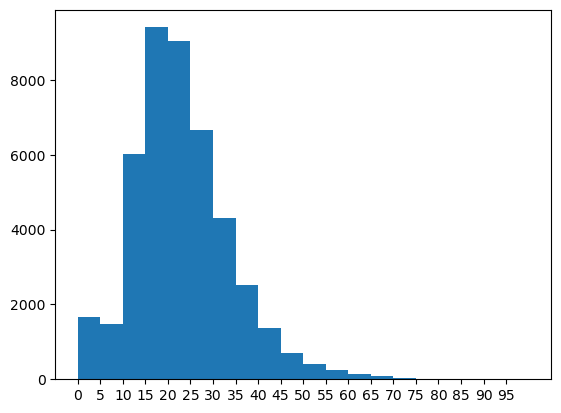

In [351]:
plt.hist(food_df_ind['Word_Len'],bins=20,range=[0,100])
plt.xticks(np.arange(0,100,5));

Most of the journal article contain 15-25 length sentences. So I am going to work with sentences that have no more than 20 words

In [354]:
food_df_ind.head()

,AU,SO,TI,Sentence,Word_Len,Check_Aim,Check_findings,Check_methods
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk) Pegler is abund...,19,0,0,0
1,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,In this study water-extracted polysaccharides ...,36,0,0,0
2,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Methylation and NMR analysis revealed MAWP-60p...,25,1,1,0
3,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,35,0,0,0
4,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,The molecular weight monosaccharide compositio...,24,0,0,0


In [355]:
row_list = []

# food_df_ind contains all sentences from all speeches

for i in range(len(food_df_ind)):
    
    sentence = food_df_ind.loc[i,'Sentence']
    
    if (',' not in sentence) and (len(sentence.split()) <= 20):
        
        TI = food_df_ind.loc[i,'TI']
        
        length = len(sentence.split())
        
        dict1 = {'TI':TI,'Sentence':sentence,'Word_Len':length}
        row_list.append(dict1)
        
# df with shorter sentences
food_df_ind_short = pd.DataFrame(columns=['Year','Sent',"Len"])
food_df_ind_short = pd.DataFrame(row_list)

In [364]:
food_df_ind_short.loc[5,"Sentence"]

'Newtonian behavior was evident at low concentrations whereas pseudoplastic behavior was observed at high concentrations.'

Now, lets come up with a function that will generate random sentences from this dataframe.



In [381]:
from random import randint
def rand_sent(df):
    
    index = randint(0, len(df))
    print('Index = ',index)
    doc = nlp(df.loc[index,'Sentence'][1:])
    displacy.render(doc, style='dep',jupyter=True)
    
    return index

In [382]:
rand_sent(food_df_ind_short)

Index =  5483


C:\Users\user\AppData\Roaming\Python\Python38\site-packages\spacy\displacy\__init__.py:70: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



5483

Finally, let's make a fucntion to evaluate the result of our rule.

In [383]:
# function to check output percentage for a rule
def output_per(df,out_col):
    
    result = 0
    
    for out in df[out_col]:
        if len(out)!=0:
            result+=1
    
    per = result/len(df)
    per *= 100
    
    return per

### I.E. 4: Rule on Noun-Verb-Noun Phrases

When you look at a sentence, it generally contains a subject (noun or proper noun), action (verb), and an object (noun). The rest of the words are just there to give us additional information about the entities. Therefore, we can leverage this basic structure to extract the main bits of information from the sentence. Take for example the following sentence:

In [384]:
food_df_ind_short.loc[5483,"Sentence"]

'Yellosp and Whitesp which are local sweetpotato varieties were also included as check for roots and leaves respectively.'

In [386]:
from spacy import displacy

doc = nlp(food_df_ind_short.loc[5483,"Sentence"])
displacy.render(doc, style='dep',jupyter=True)

C:\Users\user\AppData\Roaming\Python\Python38\site-packages\spacy\displacy\__init__.py:70: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



What will be extracted from this sample sentence based on the rule is – “Whitesp are sweetpotato”. This should give us a fair idea about what the sentence is trying to say.

In [387]:
# Function for rule 1: noun(subject), verb, noun(object)
def rule1(text):
    
    doc = nlp(text)
    
    sent = []
    
    for token in doc:
        
        # If the token is a verb
        if (token.pos_=='VERB'):
            
            phrase =''
            
            # Only extract noun or pronoun subjects
            for sub_tok in token.lefts:
                
                if (sub_tok.dep_ in ['nsubj','nsubjpass']) and (sub_tok.pos_ in ['NOUN','PROPN','PRON']):
                    
                    # Add subject to the phrase
                    phrase += sub_tok.text

                    # Save the root of the word in phrase
                    phrase += ' '+token.lemma_ 

                    # Check for noun or pronoun direct objects
                    for sub_tok in token.rights:
                        
                        # Save the object in the phrase
                        if (sub_tok.dep_ in ['dobj']) and (sub_tok.pos_ in ['NOUN','PROPN']):
                                    
                            phrase += ' '+sub_tok.text
                            sent.append(phrase)
            
    return sent

In [ ]:
# Create a df containing Sentenceence and its output for rule 1
# Apply rule1 function to all rows using vectorized operations
output = food_df_ind_short['Sentence'].apply(rule1)

# Create a new DataFrame with the desired columns
df_rule1 = pd.DataFrame({
    'TI': food_df_ind_short['TI'],
    'Sentence': food_df_ind_short['Sentence'],
    'Output': output
})

output_per(df_rule1,'Output')

In [393]:
output_per(df_rule1,'Output')

27.051893681238436

We are getting more than 20% pattern match for our rule, we can check it for all the sentences in the corpus.

In [394]:
# Apply rule1 function to all rows using vectorized operations
output = food_df_ind['Sentence'].apply(rule1)

# Create a new DataFrame with the desired columns
df_rule1_all = pd.DataFrame({
    'TI': food_df_ind['TI'],
    'Sentence': food_df_ind['Sentence'],
    'Output': output
})

# Check rule1 output on complete speeches
output_per(df_rule1_all,'Output')

32.142533731775785

We are getting more than a 30% match for our rules, which means 14,196 out of 44,172 sentences matched this pattern. Let’s form a new dataframe containing only those sentences that have an output and then segregate the verb from the nouns:

In [457]:
# selecting non-empty output rows
df_show = pd.DataFrame(columns=df_rule1_all.columns)

for row in range(len(df_rule1_all)):
    
    if len(df_rule1_all.loc[row,'Output'])!=0:
        df_show = pd.concat([df_show, df_rule1_all.loc[[row], :]])

# reset the index
df_show.reset_index(inplace=True)
df_show.drop('index',axis=1,inplace=True)

In [458]:
df_show.head()

,TI,Sentence,Output
0,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,[fractions exhibit conformation]
1,A branched galactoglucan with flexible chains ...,Showed it had a molecular weight of 210 kDa an...,[it have weight]
2,A branched galactoglucan with flexible chains ...,This work provides a theoretical basis for the...,[work provide basis]
3,Structural characterization and rheological pr...,This work can provide a basis theory to expand...,[work provide theory]
4,Dispersive micro-solid-phase extraction of aca...,Under the optimal conditions all target analyt...,[analytes have relationship]


In [456]:
# separate subject, verb and object

verb_dict = dict()
dis_dict = dict()
dis_list = []

# iterating over all the sentences
for i in range(len(df_show)):
    
    # sentence containing the output
    sentence = df_show.loc[i,'Sentence']
    # TI of the sentence
    TI = df_show.loc[i,'TI']
    # output of the sentence
    output = df_show.loc[i,'Output']
    
    # iterating over all the outputs from the sentence
    for sent in output:
        
        # separate subject, verb and object
        n1 = sent.split()[:1]
        v = sent.split()[1]
        n2 = sent.split()[2:]
        
        # append to list, along with the sentence
        dis_dict = {'Sentence':sentence,'TI':TI,'Noun1':n1,'Verb':v,'Noun2':n2}
        dis_list.append(dis_dict)
        
        # counting the number of sentences containing the verb
        verb = sent.split()[1]
        if verb in verb_dict:
            verb_dict[verb]+=1
        else:
            verb_dict[verb]=1

df_sep = pd.DataFrame(dis_list)

IndexError: list index out of range

In [405]:
df_sep

,Sentence,TI,Noun1,Verb,Noun2
0,Besides three fractions exhibited random coil ...,Revealing the architecture and solution proper...,[fractions],exhibit,[conformation]
1,Showed it had a molecular weight of 210 kDa an...,A branched galactoglucan with flexible chains ...,[it],have,[weight]
2,This work provides a theoretical basis for the...,A branched galactoglucan with flexible chains ...,[work],provide,[basis]
3,This work can provide a basis theory to expand...,Structural characterization and rheological pr...,[work],provide,[theory]
4,Under the optimal conditions all target analyt...,Dispersive micro-solid-phase extraction of aca...,[analytes],have,[relationship]
...,...,...,...,...,...
15843,Furthermore SFPS also suppressed the expressio...,Sargassum fusiforme polysaccharide attenuates ...,[SFPS],suppress,[expression]
15844,We also found that SFPS ameliorated developmen...,Sargassum fusiforme polysaccharide attenuates ...,[SFPS],ameliorate,[abnormalities]
15845,Results show that the microwave drying curve c...,Microwave intermittent drying characteristics ...,[curve],consist,[period]
15846,As the microwave power and heating time increa...,Microwave intermittent drying characteristics ...,[power],increase,[time]


In [406]:
sort = sorted(verb_dict.items(), key = lambda d:(d[1],d[0]), reverse=True)
# top 10 most used verbs in sentence
sort[:10]

[('have', 1627), ('show', 1417), ('provide', 615), ('increase', 524), ('exhibit', 426), ('reduce', 412), ('improve', 398), ('investigate', 318), ('affect', 313), ('present', 301)]

In [408]:
# support verb
df_sep[df_sep['Verb']=='provide']

,Sentence,TI,Noun1,Verb,Noun2
2,This work provides a theoretical basis for the...,A branched galactoglucan with flexible chains ...,[work],provide,[basis]
3,This work can provide a basis theory to expand...,Structural characterization and rheological pr...,[work],provide,[theory]
14,These findings provide new insights on the fun...,Gut microbiota-involved metabolism and intesti...,[findings],provide,[insights]
42,In conclusion the present study provides new e...,Apple polyphenol extract targets circadian rhy...,[study],provide,[evidence]
49,Sprouting provides suitable conditions for bac...,Transduction of stx2a mediated by phage (Phi11...,[Sprouting],provide,[conditions]
...,...,...,...,...,...
15705,The present study provides a useful guideline ...,Glass transition and stickiness characteristic...,[study],provide,[guideline]
15733,Our results provide insights into spreading th...,Integrated metabolic phenotypes and gene expre...,[results],provide,[insights]
15757,Atomic force microscopy studies of the interfa...,Effect of surfactant-induced competitive displ...,[pectin],provide,[resistance]
15807,Atmospheric pressure argon jet plasma provides...,Hydrophilic modification of poly(ether)sulfone...,[plasma],provide,[character]


In [410]:
df_sep

,Sentence,TI,Noun1,Verb,Noun2
0,Besides three fractions exhibited random coil ...,Revealing the architecture and solution proper...,[fractions],exhibit,[conformation]
1,Showed it had a molecular weight of 210 kDa an...,A branched galactoglucan with flexible chains ...,[it],have,[weight]
2,This work provides a theoretical basis for the...,A branched galactoglucan with flexible chains ...,[work],provide,[basis]
3,This work can provide a basis theory to expand...,Structural characterization and rheological pr...,[work],provide,[theory]
4,Under the optimal conditions all target analyt...,Dispersive micro-solid-phase extraction of aca...,[analytes],have,[relationship]
...,...,...,...,...,...
15843,Furthermore SFPS also suppressed the expressio...,Sargassum fusiforme polysaccharide attenuates ...,[SFPS],suppress,[expression]
15844,We also found that SFPS ameliorated developmen...,Sargassum fusiforme polysaccharide attenuates ...,[SFPS],ameliorate,[abnormalities]
15845,Results show that the microwave drying curve c...,Microwave intermittent drying characteristics ...,[curve],consist,[period]
15846,As the microwave power and heating time increa...,Microwave intermittent drying characteristics ...,[power],increase,[time]


In [420]:
df_sep = df_sep[["TI","Noun1","Verb","Noun2"]]
df_sep

,TI,Noun1,Verb,Noun2
0,Revealing the architecture and solution proper...,[fractions],exhibit,[conformation]
1,A branched galactoglucan with flexible chains ...,[it],have,[weight]
2,A branched galactoglucan with flexible chains ...,[work],provide,[basis]
3,Structural characterization and rheological pr...,[work],provide,[theory]
4,Dispersive micro-solid-phase extraction of aca...,[analytes],have,[relationship]
...,...,...,...,...
15843,Sargassum fusiforme polysaccharide attenuates ...,[SFPS],suppress,[expression]
15844,Sargassum fusiforme polysaccharide attenuates ...,[SFPS],ameliorate,[abnormalities]
15845,Microwave intermittent drying characteristics ...,[curve],consist,[period]
15846,Microwave intermittent drying characteristics ...,[power],increase,[time]


In [459]:
df_show['Output'] = df_show['Output'].apply(lambda x: ''.join(x))
display(df_show)

,TI,Sentence,Output
0,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,fractions exhibit conformation
1,A branched galactoglucan with flexible chains ...,Showed it had a molecular weight of 210 kDa an...,it have weight
2,A branched galactoglucan with flexible chains ...,This work provides a theoretical basis for the...,work provide basis
3,Structural characterization and rheological pr...,This work can provide a basis theory to expand...,work provide theory
4,Dispersive micro-solid-phase extraction of aca...,Under the optimal conditions all target analyt...,analytes have relationship
...,...,...,...
14193,Sargassum fusiforme polysaccharide attenuates ...,Furthermore SFPS also suppressed the expressio...,SFPS suppress expression
14194,Sargassum fusiforme polysaccharide attenuates ...,We also found that SFPS ameliorated developmen...,SFPS ameliorate abnormalities
14195,Microwave intermittent drying characteristics ...,Results show that the microwave drying curve c...,curve consist period
14196,Microwave intermittent drying characteristics ...,As the microwave power and heating time increa...,power increase time


In [461]:
# # Group the aims by topic and store all the aims in a list
# output_list = df_show.groupby('TI')['Output'].apply(list).reset_index()
# output_list

# # Merge the aim_counts dataframe with food_df based on the 'TI' column
# food_df = pd.merge(food_df, output_list, on='TI', how='left')

# # Print the resulting food_df dataframe
# display(food_df)

,AU,SO,TI,AB,AB_Clean,Aim_Count,Aims,Findings_Count,Findings,Methods_Count,Methods,Keywords_LDA,Output
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...,Macrolepiota albuminosa (Berk) Pegler is abund...,1.0,[Methylation and NMR analysis revealed MAWP-60...,1.0,[Methylation and NMR analysis revealed MAWP-60...,0.0,0,"study, samples, quality, showed, activity, aci...",[fractions exhibit conformation]
1,"[Yu-Xiao Wang, Yue Xin, Xiao-Jun Huang, Jun...",Food Chemistry,A branched galactoglucan with flexible chains ...,A homogeneous galactoglucan was purified from ...,A homogeneous galactoglucan was purified from ...,0.0,0,1.0,[This work provides a theoretical basis for th...,0.0,0,"study, samples, quality, showed, activity, aci...","[it have weight, work provide basis]"
2,"[Yu-Xiao Wang, Ting Zhang, Jun-Yi Yin, Xiao...",Food Hydrocolloids,Structural characterization and rheological pr...,A homogeneous beta-glucan (JHMP-70) was obtain...,A homogeneous beta-glucan (JHMP-70) was obtain...,1.0,[Its fine structure was investigated by FT-IR ...,1.0,[SEM observation revealed that there were micr...,0.0,0,"properties, antioxidant, content, showed, stud...",[work provide theory]
3,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,A novel dispersive micro-solid-phase extractio...,A novel dispersive micro-solid-phase extractio...,0.0,0,0.0,0,4.0,[A novel dispersive micro-solid-phase extracti...,"wines, extraction, method, wine, results, food...",[analytes have relationship]
4,"[Yu-Xue Xu, Ze-Dong Jiang, Xi-Ping Du, Ming...",Food Chemistry,The identification of biotransformation pathwa...,The yeast Saccharomyces cerevisiae is effectiv...,The yeast Saccharomyces cerevisiae is effectiv...,1.0,[The seaweed B. Fusco-purpurea was taken as an...,2.0,[The seaweed B. Fusco-purpurea was taken as an...,0.0,0,"method, study, '', ``, food, analysis, results...","[keto reductase synthase, findings enrich know..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4989,"[Dan Hai, Xianqing Huang, Lianjun Song]",Food Science & Nutrition,Effects of different modified atmosphere treat...,The high moisture and nutrient contents of spi...,The high moisture and nutrient contents of spi...,1.0,[Therefore for identifying packaging methods t...,0.0,0,1.0,[Therefore for identifying packaging methods t...,"food, study, properties, quality, different, s...","[study investigate effects, CO2 show ability, ..."
4990,"[Dan Hai, Zhaoxin Lu, Xianqing Huang, Fengx...",Foods,In vitro screening of chicken-derived Lactobac...,Inhibition of Salmonella by Lactobacillus has ...,Inhibition of Salmonella by Lactobacillus has ...,0.0,0,3.0,[In this study 89 strains of Lactobacillus fro...,1.0,[In this study 89 strains of Lactobacillus fro...,"study, mice, expression, microbiota, effects, ...",[inhibition derive Lactobacilluschicken inhibi...
4991,"[Dan He, Liping Yan, Jiaqi Zhang, Fang Li, ...",Food Science & Nutrition,Sargassum fusiforme polysaccharide attenuates ...,Lipid accumulation is a major factor in the de...,Lipid accumulation is a major factor in the de...,1.0,[In this study we investigated the ability of ...,2.0,[The results indicated that SFPS significantly...,0.0,0,"study, mice, expression, microbiota, effects, ...","[we investigate ability, SFPS decrease accumul..."
4992,"[Dan Hu, Jinyong Wu, Long Jin, Lixia Yuan, ...",Food Research International,Evaluation of Pediococcus pentosaceus strains ...,Soybean milk is an economical substitute for d...,Soybean milk is an economical substitute for d...,1.0,[In this study four P. pentosaceus strains (CI...,3.0,[In this study four P. pentosaceus strains (CI...,0.0,0,"study, mice, expression, microbiota, effects, ...",NaN


### Information Extraction #4 – Rule on Adjective Noun Structure

In [473]:
text = 'Our people are expecting a better life.'
print(text)
doc = nlp(text)
img = displacy.render(doc, style='dep',jupyter=True)
img

#output_path = Path("./img2.svg")
#output_path.open("w", encoding="utf-8").write(img)

Our people are expecting a better life.


C:\Users\user\AppData\Roaming\Python\Python38\site-packages\spacy\displacy\__init__.py:70: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



What we are looking to achieve here is: "people","expecting" and "better life".

The code for this rule is simple, but let me walk you through how it works:

We look for tokens that have a Noun POS tag and have subject or object dependency
Then we look at the child nodes of these tokens and append it to the phrase only if it modifies the noun

In [476]:
# function for rule 2
def rule2(text):
    
    doc = nlp(text)

    pat = []
    
    # iterate over tokens
    for token in doc:
        phrase = ''
        # if the word is a subject noun or an object noun
        if (token.pos_ == 'NOUN')\
            and (token.dep_ in ['dobj','pobj','nsubj','nsubjpass']):
            
            # iterate over the children nodes
            for subtoken in token.children:
                # if word is an adjective or has a compound dependency
                if (subtoken.pos_ == 'ADJ') or (subtoken.dep_ == 'compound'):
                    phrase += subtoken.text + ' '
                    
            if len(phrase)!=0:
                phrase += token.text
             
        if  len(phrase)!=0:
            pat.append(phrase)
        
    
    return pat

In [477]:
# Create a df containing Sentence and its output for rule 2
row_list = [
    
    {
        'TI': food_df_ind_short.loc[i, 'TI'],
        'Sentence': food_df_ind_short.loc[i, 'Sentence'],
        'Output': rule2(food_df_ind_short.loc[i, 'Sentence'])
    }
    for i in range(len(food_df_ind_short))
]

df_rule2 = pd.DataFrame(row_list)

In [478]:
# Rule 2 output
output_per(df_rule2,'Output')

82.64044396845487

82% of the short sentences match this rule. We can try now check it on the entire corpus.

In [479]:
row_list = [
    
    {
        'TI': food_df_ind.loc[i, 'TI'],
        'Sentence': food_df_ind.loc[i, 'Sentence'],
        'Output': rule2(food_df_ind.loc[i, 'Sentence'])
    }
    for i in range(len(food_df_ind))
]

df_rule2_all = pd.DataFrame(row_list)

# check rule output on complete speeches
output_per(df_rule2_all,'Output')

90.79507380240877

In [480]:
df_rule2_all

,TI,Sentence,Output
0,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk) Pegler is abund...,"[Macrolepiota albuminosa, active polysaccharides]"
1,Revealing the architecture and solution proper...,In this study water-extracted polysaccharides ...,"[M. albuminosa, structural heterogeneity, weig..."
2,Revealing the architecture and solution proper...,Methylation and NMR analysis revealed MAWP-60p...,[branched galactoglucan]
3,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,"[random coil conformation, aqueous solution, h..."
4,Revealing the architecture and solution proper...,The molecular weight monosaccharide compositio...,"[weight monosaccharide composition, flexibilit..."
...,...,...,...
44167,Microwave intermittent drying characteristics ...,However several disadvantages of hot-air dryin...,"[several disadvantages, air drying]"
44168,Microwave intermittent drying characteristics ...,Therefore finding a drying method that is more...,[]
44169,Microwave intermittent drying characteristics ...,Microwave intermittent drying is a type of dis...,"[intermittent drying, discontinuous drying]"
44170,Microwave intermittent drying characteristics ...,The moisture and temperature inside the materi...,[intermittent time]


Now we can combine this rule along with the rule that we created previously. This will give us a better perspective of what information in present in a sentence.

In [481]:
def rule2_mod(text,index):
    
    doc = nlp(text)

    phrase = ''
    
    for token in doc:
        
        if token.i == index:
            
            for subtoken in token.children:
                if (subtoken.pos_ == 'ADJ'):
                    phrase += ' '+subtoken.text
            break
    
    return phrase

In [482]:
# rule 1 modified function
def rule1_mod(text):
    
    doc = nlp(text)
    
    sent = []
    
    for token in doc:
        # root word
        if (token.pos_=='VERB'):
            
            phrase =''
            
            # only extract noun or pronoun subjects
            for sub_tok in token.lefts:
                
                if (sub_tok.dep_ in ['nsubj','nsubjpass']) and (sub_tok.pos_ in ['NOUN','PROPN','PRON']):
                        
                    adj = rule2_mod(text,sub_tok.i)
                    
                    phrase += adj + ' ' + sub_tok.text

                    # save the root word of the word
                    phrase += ' '+token.lemma_ 

                    # check for noun or pronoun direct objects
                    for sub_tok in token.rights:
                        
                        if (sub_tok.dep_ in ['dobj']) and (sub_tok.pos_ in ['NOUN','PROPN']):
                             
                            adj = rule2_mod(text,sub_tok.i)
                            
                            phrase += adj+' '+sub_tok.text
                            sent.append(phrase)
            
    return sent

In [483]:
# create a df containing Sentenceence and its output for modified rule 1
row_list = []

# food_df_ind contains all the Sentenceences from all the speeches
for i in range(len(food_df_ind)):
    
    Sentence = food_df_ind.loc[i,'Sentence']
    TI = food_df_ind.loc[i,'TI']
    output = rule1_mod(Sentence)
    dict1 = {'TI':TI,'Sentence':Sentence,'Output':output}
    row_list.append(dict1)
    
df_rule1_mod_all = pd.DataFrame(row_list)
# check rule1 output on complete speeches
output_per(df_rule1_mod_all,'Output')

32.142533731775785

In [484]:
df_rule1_mod_all

,TI,Sentence,Output
0,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk) Pegler is abund...,[]
1,Revealing the architecture and solution proper...,In this study water-extracted polysaccharides ...,[]
2,Revealing the architecture and solution proper...,Methylation and NMR analysis revealed MAWP-60p...,[]
3,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,[ fractions exhibit random conformation]
4,Revealing the architecture and solution proper...,The molecular weight monosaccharide compositio...,[]


In [485]:
# selecting non-empty output rows
df_show_mod = pd.DataFrame(columns=df_rule1_mod_all.columns)

for row in range(len(df_rule1_mod_all)):
    
    if len(df_rule1_mod_all.loc[row,'Output'])!=0:
        df_show_mod = pd.concat([df_show_mod, df_rule1_mod_all.loc[[row], :]])

# reset the index
df_show_mod.reset_index(inplace=True)
df_show_mod.drop('index',axis=1,inplace=True)

In [486]:
df_show_mod

,TI,Sentence,Output
0,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,[ fractions exhibit random conformation]
1,A branched galactoglucan with flexible chains ...,Showed it had a molecular weight of 210 kDa an...,[ it have molecular weight]
2,A branched galactoglucan with flexible chains ...,This work provides a theoretical basis for the...,[ work provide theoretical basis]
3,Structural characterization and rheological pr...,This work can provide a basis theory to expand...,[ work provide theory]
4,Dispersive micro-solid-phase extraction of aca...,Under the optimal conditions all target analyt...,[ analytes have good linear relationship]
...,...,...,...
14193,Sargassum fusiforme polysaccharide attenuates ...,Furthermore SFPS also suppressed the expressio...,[ SFPS suppress expression]
14194,Sargassum fusiforme polysaccharide attenuates ...,We also found that SFPS ameliorated developmen...,[ SFPS ameliorate developmental abnormalities]
14195,Microwave intermittent drying characteristics ...,Results show that the microwave drying curve c...,[ curve consist constant period]
14196,Microwave intermittent drying characteristics ...,As the microwave power and heating time increa...,[ power increase time]


In [ ]:
df_show_mod

In [489]:
df_show_mod['Output'] = df_show_mod['Output'].apply(lambda x: ''.join(x))
display(df_show_mod)

,TI,Sentence,Output
0,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,fractions exhibit random conformation
1,A branched galactoglucan with flexible chains ...,Showed it had a molecular weight of 210 kDa an...,it have molecular weight
2,A branched galactoglucan with flexible chains ...,This work provides a theoretical basis for the...,work provide theoretical basis
3,Structural characterization and rheological pr...,This work can provide a basis theory to expand...,work provide theory
4,Dispersive micro-solid-phase extraction of aca...,Under the optimal conditions all target analyt...,analytes have good linear relationship
...,...,...,...
14193,Sargassum fusiforme polysaccharide attenuates ...,Furthermore SFPS also suppressed the expressio...,SFPS suppress expression
14194,Sargassum fusiforme polysaccharide attenuates ...,We also found that SFPS ameliorated developmen...,SFPS ameliorate developmental abnormalities
14195,Microwave intermittent drying characteristics ...,Results show that the microwave drying curve c...,curve consist constant period
14196,Microwave intermittent drying characteristics ...,As the microwave power and heating time increa...,power increase time


In [490]:
# Group the aims by topic and store all the aims in a list
output_list = df_show_mod.groupby('TI')['Output'].apply(list).reset_index()
output_list

# Merge the aim_counts dataframe with food_df based on the 'TI' column
food_df = pd.merge(food_df, output_list, on='TI', how='left')

# Print the resulting food_df dataframe
display(food_df)

,AU,SO,TI,AB,AB_Clean,Aim_Count,Aims,Findings_Count,Findings,Methods_Count,Methods,Keywords_LDA,Output
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...,Macrolepiota albuminosa (Berk) Pegler is abund...,1.0,[Methylation and NMR analysis revealed MAWP-60...,1.0,[Methylation and NMR analysis revealed MAWP-60...,0.0,0,"study, samples, quality, showed, activity, aci...",[ fractions exhibit random conformation]
1,"[Yu-Xiao Wang, Yue Xin, Xiao-Jun Huang, Jun...",Food Chemistry,A branched galactoglucan with flexible chains ...,A homogeneous galactoglucan was purified from ...,A homogeneous galactoglucan was purified from ...,0.0,0,1.0,[This work provides a theoretical basis for th...,0.0,0,"study, samples, quality, showed, activity, aci...","[ it have molecular weight, work provide theo..."
2,"[Yu-Xiao Wang, Ting Zhang, Jun-Yi Yin, Xiao...",Food Hydrocolloids,Structural characterization and rheological pr...,A homogeneous beta-glucan (JHMP-70) was obtain...,A homogeneous beta-glucan (JHMP-70) was obtain...,1.0,[Its fine structure was investigated by FT-IR ...,1.0,[SEM observation revealed that there were micr...,0.0,0,"properties, antioxidant, content, showed, stud...",[ work provide theory]
3,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,A novel dispersive micro-solid-phase extractio...,A novel dispersive micro-solid-phase extractio...,0.0,0,0.0,0,4.0,[A novel dispersive micro-solid-phase extracti...,"wines, extraction, method, wine, results, food...",[ analytes have good linear relationship]
4,"[Yu-Xue Xu, Ze-Dong Jiang, Xi-Ping Du, Ming...",Food Chemistry,The identification of biotransformation pathwa...,The yeast Saccharomyces cerevisiae is effectiv...,The yeast Saccharomyces cerevisiae is effectiv...,1.0,[The seaweed B. Fusco-purpurea was taken as an...,2.0,[The seaweed B. Fusco-purpurea was taken as an...,0.0,0,"method, study, '', ``, food, analysis, results...","[ keto reductase synthase, findings enrich kn..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4989,"[Dan Hai, Xianqing Huang, Lianjun Song]",Food Science & Nutrition,Effects of different modified atmosphere treat...,The high moisture and nutrient contents of spi...,The high moisture and nutrient contents of spi...,1.0,[Therefore for identifying packaging methods t...,0.0,0,1.0,[Therefore for identifying packaging methods t...,"food, study, properties, quality, different, s...","[ study investigate effects, CO2 show stronge..."
4990,"[Dan Hai, Zhaoxin Lu, Xianqing Huang, Fengx...",Foods,In vitro screening of chicken-derived Lactobac...,Inhibition of Salmonella by Lactobacillus has ...,Inhibition of Salmonella by Lactobacillus has ...,0.0,0,3.0,[In this study 89 strains of Lactobacillus fro...,1.0,[In this study 89 strains of Lactobacillus fro...,"study, mice, expression, microbiota, effects, ...",[ inhibition derive Lactobacillus isolated chi...
4991,"[Dan He, Liping Yan, Jiaqi Zhang, Fang Li, ...",Food Science & Nutrition,Sargassum fusiforme polysaccharide attenuates ...,Lipid accumulation is a major factor in the de...,Lipid accumulation is a major factor in the de...,1.0,[In this study we investigated the ability of ...,2.0,[The results indicated that SFPS significantly...,0.0,0,"study, mice, expression, microbiota, effects, ...","[ we investigate ability, SFPS decrease accum..."
4992,"[Dan Hu, Jinyong Wu, Long Jin, Lixia Yuan, ...",Food Research International,Evaluation of Pediococcus pentosaceus strains ...,Soybean milk is an economical substitute for d...,Soybean milk is an economical substitute for d...,1.0,[In this study four P. pentosaceus strains (CI...,3.0,[In this study four P. pentosaceus strains (CI...,0.0,0,"study, mice, expression, microbiota, effects, ...",NaN


In [491]:
food_df.to_csv("Rule 1 and 2.csv")

### Information Extraction #5 – Rule on Prepositions

Thank god for preposistions. They tell us where or when something is in relationship with something else. For example, The people of* India believe in the priciples of United Nations.*. Clearly extarcting phrases inclusing prepositions will give us a lot of information from the sentence. This is exactly what we are going to achieve with this rule.

Let's try to understand how this rule works by going over it on a sample sentece - "India has once again shown faith in democracy."

We iterate over all the tokens looking for prepositions. For example in in this sentence.
On encountering a preposition, we check if it has a head word that is a noun. For example the word faith in this sentence.
Then we look at the child tokens of the preposition token falling on its right side. For example, the word democracy.
This should finally extract the phrase faith in democracy from the sentence. Have a look at the dependency graph of the sentence below.

In [492]:
text = "India has once again shown faith in democracy."
print(text)
doc = nlp(text)
img = displacy.render(doc, style='dep',jupyter=True)
img

#output_path = Path("./img3.svg")
# output_path.open("w", encoding="utf-8").write(img)
# displacy.render(doc, style='dep',jupyter=True)

India has once again shown faith in democracy.


C:\Users\user\AppData\Roaming\Python\Python38\site-packages\spacy\displacy\__init__.py:70: DeprecationWarning:

Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display



In [493]:
# rule 3 function
def rule3(text):
    
    doc = nlp(text)
    
    sent = []
    
    for token in doc:

        # look for prepositions
        if token.pos_=='ADP':

            phrase = ''
            
            # if its head word is a noun
            if token.head.pos_=='NOUN':
                
                # append noun and preposition to phrase
                phrase += token.head.text
                phrase += ' '+token.text

                # check the nodes to the right of the preposition
                for right_tok in token.rights:
                    # append if it is a noun or proper noun
                    if (right_tok.pos_ in ['NOUN','PROPN']):
                        phrase += ' '+right_tok.text
                
                if len(phrase)>2:
                    sent.append(phrase)
                
    return sent

In [494]:
# create a df containing Sentenceence and its output for rule 4
row_list = []

for i in range(len(food_df_ind_short)):
    
    Sentence = food_df_ind_short.loc[i,'Sentence']
    TI = food_df_ind_short.loc[i,'TI']
    
    # Rule 3
    output = rule3(Sentence)
    
    dict1 = {'TI':TI,'Sentence':Sentence,'Output':output}
    row_list.append(dict1)

df_rule3 = pd.DataFrame(row_list)
# Rule 3 achieves 40% result
output_per(df_rule3,'Output')

60.057443286924354

About 60% of the sentences follow this rule.

In [495]:
# create a df containing Sentenceence and its output for rule 1
row_list = []

# food_df_ind contains all the Sentenceences from all the speeches
for i in range(len(food_df_ind)):
    
    Sentence = food_df_ind.loc[i,'Sentence']
    TI = food_df_ind.loc[i,'TI']
    output = rule3(Sentence)  # Output
    dict1 = {'TI':TI,'Sentence':Sentence,'Output':output}
    row_list.append(dict1)
    
df_rule3_all = pd.DataFrame(row_list)
# check rule1 output on complete speeches
output_per(df_rule3_all,'Output')

75.61351082133478

Show only those sentences that have outputs

In [497]:
# select non-empty outputs
df_show3 = pd.DataFrame(columns=df_rule3_all.columns)

for row in range(len(df_rule3_all)):
    
    if len(df_rule3_all.loc[row,'Output'])!=0:
        df_show3 = pd.concat([df_show3, df_rule3_all.loc[[row], :]])

# reset the index
df_show3.reset_index(inplace=True)
df_show3.drop('index',axis=1,inplace=True)    

In [499]:
df_show3

,TI,Sentence,Output
0,Revealing the architecture and solution proper...,In this study water-extracted polysaccharides ...,"[polysaccharides from albuminosa, fractions wi..."
1,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,[viscosity due radius]
2,Revealing the architecture and solution proper...,The molecular weight monosaccharide compositio...,"[contributors to size, size of chains]"
3,A branched galactoglucan with flexible chains ...,A homogeneous galactoglucan was purified from ...,[basidioma of albuminosa]
4,A branched galactoglucan with flexible chains ...,Showed it had a molecular weight of 210 kDa an...,[weight of kDa]
...,...,...,...
33395,Microwave intermittent drying characteristics ...,Drying is the first step in the processing of ...,"[step in processing, processing of Camellia, s..."
33396,Microwave intermittent drying characteristics ...,However several disadvantages of hot-air dryin...,"[disadvantages of drying, slowness of process]"
33397,Microwave intermittent drying characteristics ...,Microwave intermittent drying is a type of dis...,[type of drying]
33398,Microwave intermittent drying characteristics ...,The moisture and temperature inside the materi...,[moisture inside material]


As you can see, prepositions give us an important relationship between two nouns. And with a little domain knowledge we can easily seive through the vast data and determine what India supports or does not support and much more.

But at some time the output seems a bit incomplete. For example, 
Certainly we need to include the modifiers attached to the nouns in the phrase, like we did in rule 2. This would definitely increase the comprehensibility of the extracted phrase.

This rule can be easily modified to include the new change. I have created a new function to extract the noun modifiers for nouns that we extracted from rule 3.

In [500]:
# rule 0
def rule0(text, index):
    
    doc = nlp(text)
        
    token = doc[index]
    
    entity = ''
    
    for sub_tok in token.children:
        if (sub_tok.dep_ in ['compound','amod']):# and (sub_tok.pos_ in ['NOUN','PROPN']):
            entity += sub_tok.text+' '
    
    entity += token.text

    return entity

All we have to do is call this function whenever we encounter a noun in our phrase.

In [501]:
# rule 3 function
def rule3_mod(text):
    
    doc = nlp(text)
    
    sent = []
    
    for token in doc:

        if token.pos_=='ADP':

            phrase = ''
            if token.head.pos_=='NOUN':
                
                # appended rule
                append = rule0(text, token.head.i)
                if len(append)!=0:
                    phrase += append
                else:  
                    phrase += token.head.text
                phrase += ' '+token.text

                for right_tok in token.rights:
                    if (right_tok.pos_ in ['NOUN','PROPN']):
                        
                        right_phrase = ''
                        # appended rule
                        append = rule0(text, right_tok.i)
                        if len(append)!=0:
                            right_phrase += ' '+append
                        else:
                            right_phrase += ' '+right_tok.text
                            
                        phrase += right_phrase
                
                if len(phrase)>2:
                    sent.append(phrase)
                

    return sent

In [503]:
# create a df containing Sentenceence and its output for rule 3
row_list = []

# df2 contains all the Sentenceences from all the speeches
for i in range(len(df_show3)):
    
    Sentence = df_show3.loc[i,'Sentence']
    TI = df_show3.loc[i,'TI']
    output = rule3_mod(Sentence)
    dict1 = {'TI':TI,'Sentence':Sentence,'Output':output}
    row_list.append(dict1)
    
df_rule3_mod = pd.DataFrame(row_list)

In [507]:
df_rule3_mod.loc[0,"Output"]

['study extracted polysaccharides from M. albuminosa', 'fractions with structural heterogeneity', 'diversity in weight monosaccharide composition']

In [537]:
df_rule3_mod.head()

,TI,Sentence,Output
0,Revealing the architecture and solution proper...,In this study water-extracted polysaccharides ...,[study extracted polysaccharides from M. album...
1,Revealing the architecture and solution proper...,Besides three fractions exhibited random coil ...,[highest viscosity due mean square radius]
2,Revealing the architecture and solution proper...,The molecular weight monosaccharide compositio...,[major contributors to flexibility molecular s...
3,A branched galactoglucan with flexible chains ...,A homogeneous galactoglucan was purified from ...,[basidioma of Macrolepiota albuminosa]
4,A branched galactoglucan with flexible chains ...,Showed it had a molecular weight of 210 kDa an...,[molecular weight of kDa]


In [540]:
df_rule3_mod['Output']  = df_rule3_mod['Output'].apply(lambda x: ''.join(x))

In [541]:
# Group the aims by topic and store all the aims in a list
output_list = df_rule3_mod.groupby('TI')['Output'].apply(list).reset_index()
output_list

# Merge the aim_counts dataframe with food_df based on the 'TI' column
food_df = pd.merge(food_df, output_list, on='TI', how='left')

# Print the resulting food_df dataframe
display(food_df)

,AU,SO,TI,AB,AB_Clean,Aim_Count,Aims,Findings_Count,Findings,Methods_Count,Methods,Keywords_LDA,Output_x,Output
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...,Macrolepiota albuminosa (Berk) Pegler is abund...,1.0,[Methylation and NMR analysis revealed MAWP-60...,1.0,[Methylation and NMR analysis revealed MAWP-60...,0.0,0,"study, samples, quality, showed, activity, aci...",[ fractions exhibit random conformation],[study extracted polysaccharides from M. album...
1,"[Yu-Xiao Wang, Yue Xin, Xiao-Jun Huang, Jun...",Food Chemistry,A branched galactoglucan with flexible chains ...,A homogeneous galactoglucan was purified from ...,A homogeneous galactoglucan was purified from ...,0.0,0,1.0,[This work provides a theoretical basis for th...,0.0,0,"study, samples, quality, showed, activity, aci...","[ it have molecular weight, work provide theo...","[basidioma of Macrolepiota albuminosa, molecul..."
2,"[Yu-Xiao Wang, Ting Zhang, Jun-Yi Yin, Xiao...",Food Hydrocolloids,Structural characterization and rheological pr...,A homogeneous beta-glucan (JHMP-70) was obtain...,A homogeneous beta-glucan (JHMP-70) was obtain...,1.0,[Its fine structure was investigated by FT-IR ...,1.0,[SEM observation revealed that there were micr...,0.0,0,"properties, antioxidant, content, showed, stud...",[ work provide theory],"[apparent molecular weight of kDa, 3)-linked G..."
3,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,A novel dispersive micro-solid-phase extractio...,A novel dispersive micro-solid-phase extractio...,0.0,0,0.0,0,4.0,[A novel dispersive micro-solid-phase extracti...,"wines, extraction, method, wine, results, food...",[ analytes have good linear relationship],[determination of acaricidesdetermination in f...
4,"[Yu-Xue Xu, Ze-Dong Jiang, Xi-Ping Du, Ming...",Food Chemistry,The identification of biotransformation pathwa...,The yeast Saccharomyces cerevisiae is effectiv...,The yeast Saccharomyces cerevisiae is effectiv...,1.0,[The seaweed B. Fusco-purpurea was taken as an...,2.0,[The seaweed B. Fusco-purpurea was taken as an...,0.0,0,"method, study, '', ``, food, analysis, results...","[ keto reductase synthase, findings enrich kn...","[fishy malodor of sea products, transformation..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4989,"[Dan Hai, Xianqing Huang, Lianjun Song]",Food Science & Nutrition,Effects of different modified atmosphere treat...,The high moisture and nutrient contents of spi...,The high moisture and nutrient contents of spi...,1.0,[Therefore for identifying packaging methods t...,0.0,0,1.0,[Therefore for identifying packaging methods t...,"food, study, properties, quality, different, s...","[ study investigate effects, CO2 show stronge...",[nutrient contents of spiced beefpresent chall...
4990,"[Dan Hai, Zhaoxin Lu, Xianqing Huang, Fengx...",Foods,In vitro screening of chicken-derived Lactobac...,Inhibition of Salmonella by Lactobacillus has ...,Inhibition of Salmonella by Lactobacillus has ...,0.0,0,3.0,[In this study 89 strains of Lactobacillus fro...,1.0,[In this study 89 strains of Lactobacillus fro...,"study, mice, expression, microbiota, effects, ...",[ inhibition derive Lactobacillus isolated chi...,[Inhibition of SalmonellaInhibition by Lactoba...
4991,"[Dan He, Liping Yan, Jiaqi Zhang, Fang Li, ...",Food Science & Nutrition,Sargassum fusiforme polysaccharide attenuates ...,Lipid accumulation is a major factor in the de...,Lipid accumulation is a major factor in the de...,1.0,[In this study we investigated the ability of ...,2.0,[The results indicated that SFPS significantly...,0.0,0,"study, mice, expression, microbiota, effects, ...","[ we investigate ability, SFPS decrease accum...",[major factor in developmentdevelopment of liv...
4992,"[Dan Hu, Jinyong Wu, Long Jin, Lixia Yuan, ...",Food Research Internat

In [542]:
food_df.to_csv("Last_findings.csv")

In [543]:
# import SetSimilaritySearch
# from SetSimilaritySearch import SearchIndex  # Assuming you have installed the SetSimilaritySearch package
# from sklearn.metrics.pairwise import cosine_similarity
# import numpy as np

# import networkx as nx

# def generate_shingles(label):
#     shingles = set()
#     for i in range(len(label) - 1):
#         shingle = label[i:i+2].lower()
#         if label[i].isalpha() and label[i+1].isalpha():
#             shingles.add(shingle)
#     return shingles

# def coreference_resolution(labels):
#     # Step 1: Parsing abbreviations and full forms
#     abbreviations = {}
#     for label in labels:
#         if "(" in label and ")" in label:
#             abbreviation_start = label.index("(") + 1
#             abbreviation_end = label.index(")")
#             abbreviation = label[abbreviation_start:abbreviation_end]
#             full_form = label.replace("(" + abbreviation + ")", "").strip()
#             abbreviations[abbreviation] = full_form
    
#     # Step 2: Finding similar entities and abbreviations
#     shingle_sets = {label: generate_shingles(label) for label in labels}
#     search_index = SearchIndex(list(shingle_sets.values()))
    
#     similar_pairs = []
#     for i, label in enumerate(labels):
#         similar_entities = []
#         for j, other_label in enumerate(labels[i+1:], start=i+1):
#             label_set = shingle_sets[label]
#             other_set = shingle_sets[other_label]
#             similarity = len(label_set.intersection(other_set)) / len(label_set.union(other_set))
#             if similarity > 0.85:
#                 similar_entities.append(other_label)
#         for similar_entity in similar_entities:
#             similar_pairs.append((label, similar_entity))
    
#     # Step 3: Extracting clusters
#     G = nx.Graph()
#     G.add_edges_from(similar_pairs)
    
#     # Group specific entities together
#     for abbreviation, full_form in abbreviations.items():
#         G.add_edge(abbreviation, full_form)
    
#     clusters = [list(component) for component in nx.connected_components(G)]
    
#     return clusters

# # Example usage
# labels = [
#     "Massachusetts Institute of Technology",
#     "MIT",
#     "k-Nearest Neighbors",
#     "kNN",
#     "Markov",
#     "MaRKoV",
#     "Harvard University",
#     "Harvard"
# ]

# clusters = coreference_resolution(labels)
# for i, cluster in enumerate(clusters):
#     print(f"Cluster {i+1}: {', '.join(cluster)}")

### I.E. 6: Topic Modeling of Topics and Abstracts : LDA

1. Abstract

In [124]:
for i, row in abstract_documents_df.iterrows():
    abstract_documents_df.at[i, 'Final_tokens'] = ' '.join(row['Final_tokens'])

# Print the updated dataframe
display(abstract_documents_df)

,Final_tokens,TI,SO
0,macrolepiota albuminosa berk pegler abundant a...,Revealing the architecture and solution proper...,Food Chemistry
1,homogeneous galactoglucan purified alkali-extr...,A branched galactoglucan with flexible chains ...,Food Chemistry
2,homogeneous beta-glucan jhmp-70 obtained hypsi...,Structural characterization and rheological pr...,Food Hydrocolloids
3,novel dispersive micro-solid-phase extraction ...,Dispersive micro-solid-phase extraction of aca...,Food Analytical Methods
4,yeast saccharomyces cerevisiae effective reduc...,The identification of biotransformation pathwa...,Food Chemistry
...,...,...,...
4989,high moisture nutrient contents spiced beef po...,Mothers choose a snack for their 2-3-year-old ...,Food Quality and Preference
4990,inhibition salmonella lactobacillus popular re...,Taqman probe based multiplex RT-PCR for simult...,LWT -- Food Science and Technology
4991,lipid accumulation major factor development no...,Curcumin nanoemulsions stabilized with natural...,Food Bioscience
4992,soybean milk economical substitute dairy produ...,Post-harvest fungal occurrence on commercial s...,Journal of Food Measurement and Characterization


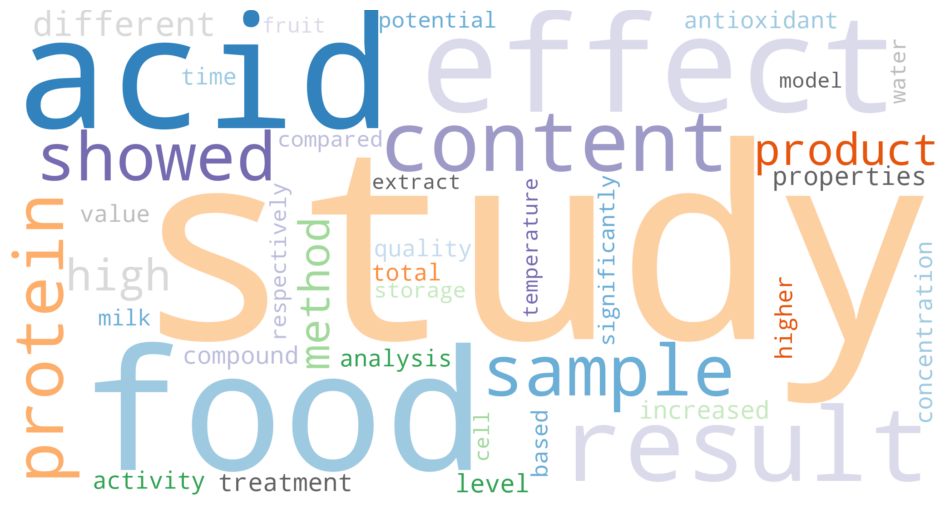

In [125]:
from wordcloud import WordCloud
abstracts = ' '.join(abstract_documents_df['Final_tokens'])

# generate Word Cloud
word_cloud = WordCloud(collocations=False,
 background_color='white',max_words=40, min_word_length=4,
 colormap='tab20c',width=2048, height=1080).generate(abstracts)
# Display the generated Word Cloud
plt.figure(figsize=(12,8))
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [126]:
abstract_documents_df['Final_tokens']

0       macrolepiota albuminosa berk pegler abundant a...
1       homogeneous galactoglucan purified alkali-extr...
2       homogeneous beta-glucan jhmp-70 obtained hypsi...
3       novel dispersive micro-solid-phase extraction ...
4       yeast saccharomyces cerevisiae effective reduc...
                              ...                        
4989    high moisture nutrient contents spiced beef po...
4990    inhibition salmonella lactobacillus popular re...
4991    lipid accumulation major factor development no...
4992    soybean milk economical substitute dairy produ...
4993    paper reports experimental investigation dryin...
Name: Final_tokens, Length: 4994, dtype: object

## Finding Number of Topics for LDA

In [283]:
from gensim.models import LdaModel
from gensim.models.coherencemodel import CoherenceModel
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = LdaModel(corpus=corpus, num_topics=num_topics, id2word=dictionary, random_state=random_seed)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [284]:
model_list, coherence_values = compute_coherence_values(dictionary=dictionary, corpus=corpus, texts=final_tokens, start=2, limit=42, step=6)

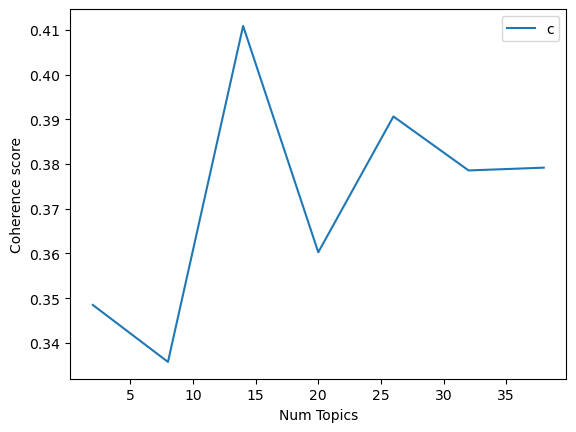

In [285]:
# Show graph
limit=42; start=2; step=6;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [287]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 2))

Num Topics = 2  has Coherence Value of 0.35
Num Topics = 8  has Coherence Value of 0.34
Num Topics = 14  has Coherence Value of 0.41
Num Topics = 20  has Coherence Value of 0.36
Num Topics = 26  has Coherence Value of 0.39
Num Topics = 32  has Coherence Value of 0.38
Num Topics = 38  has Coherence Value of 0.38


Num_topics = 14

In [291]:
lda_model = None

In [292]:
from gensim.models import LdaModel
from gensim.corpora import Dictionary

documents = abstract_documents_df['Final_tokens'].tolist()

# Obtain document vectors from the Doc2Vec model
document_vectors = [d2v_model.infer_vector(doc.split()) for doc in documents]
# Create a list of tokenised documents
tokenised_documents = [doc.split() for doc in documents]

# Create a dictionary and corpus for LDA
dictionary = Dictionary(tokenised_documents)
corpus = [dictionary.doc2bow(doc) for doc in tokenised_documents]

# Perform LDA on the corpus
num_topics = 14  # Specify the number of topics you want to extract
lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary,  random_state=random_seed)

# Get the topic distribution for each document
topic_distributions = lda_model[corpus]

# Convert the topic distributions to a DataFrame for easier analysis
topics_df = pd.DataFrame([[topic[1] for topic in doc_topics] for doc_topics in topic_distributions],
                         columns=[f'Topic_{i+1}' for i in range(num_topics)])

# Concatenate the topics DataFrame with the original DataFrame
result_df = pd.concat([abstract_documents_df, topics_df], axis=1)

In [293]:
# result_df

In [294]:
# def format_topics_sentences(ldamodel=None, corpus=corpus, texts=data):
#     # Init output
#     sent_topics_df = pd.DataFrame()

#     # Get main topic in each document
#     for i, row_list in enumerate(ldamodel[corpus]):
#         row = row_list[0] if ldamodel.per_word_topics else row_list            
#         # print(row)
#         row = sorted(row, key=lambda x: (x[1]), reverse=True)
#         # Get the Dominant topic, Perc Contribution and Keywords for each document
#         for j, (topic_num, prop_topic) in enumerate(row):
#             if j == 0:  # => dominant topic
#                 wp = ldamodel.show_topic(topic_num)
#                 topic_keywords = ", ".join([word for word, prop in wp])
#                 sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
#             else:
#                 break
#     sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

#     # Add original text to the end of the output
#     contents = pd.Series(texts)
#     sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
#     return(sent_topics_df)


# df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=final_tokens)

# # Format
# df_dominant_topic = df_topic_sents_keywords.reset_index()
# df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
# df_dominant_topic.head(10)

In [295]:
result_df

,Final_tokens,TI,SO,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9,Topic_10,Topic_11,Topic_12,Topic_13,Topic_14
0,macrolepiota albuminosa berk pegler abundant a...,Revealing the architecture and solution proper...,Food Chemistry,0.988628,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,homogeneous galactoglucan purified alkali-extr...,A branched galactoglucan with flexible chains ...,Food Chemistry,0.329518,0.127631,0.533841,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,homogeneous beta-glucan jhmp-70 obtained hypsi...,Structural characterization and rheological pr...,Food Hydrocolloids,0.360009,0.044637,0.345456,0.243635,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,novel dispersive micro-solid-phase extraction ...,Dispersive micro-solid-phase extraction of aca...,Food Analytical Methods,0.991757,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,yeast saccharomyces cerevisiae effective reduc...,The identification of biotransformation pathwa...,Food Chemistry,0.314077,0.676280,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4989,high moisture nutrient contents spiced beef po...,Mothers choose a snack for their 2-3-year-old ...,Food Quality and Preference,0.670204,0.110614,0.106138,0.107325,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4990,inhibition salmonella lactobacillus popular re...,Taqman probe based multiplex RT-PCR for simult...,LWT -- Food Science and Technology,0.740615,0.252837,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4991,lipid accumulation major factor development no...,Curcumin nanoemulsions stabilized with natural...,Food Bioscience,0.094032,0.092686,0.780928,0.025478,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4992,soybean milk economical substitute dairy produ...,Post-harvest fungal occurrence on commercial s...,Journal of Food Measurement and Characterization,0.216997,0.539004,0.238085,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [296]:
print(lda_model.print_topics())

[(0, '0.009*"wines" + 0.007*"extraction" + 0.007*"method" + 0.004*"wine" + 0.004*"results" + 0.004*"food" + 0.003*"samples" + 0.003*"compounds" + 0.003*"analysis" + 0.003*"conditions"'), (1, '0.006*"zein" + 0.006*"tea" + 0.005*"study" + 0.005*"mitochondrial" + 0.004*"qu" + 0.003*"nanoparticles" + 0.003*"results" + 0.003*"food" + 0.003*"effects" + 0.003*"vinegar"'), (2, '0.007*"food" + 0.007*"study" + 0.005*"properties" + 0.005*"quality" + 0.005*"different" + 0.005*"storage" + 0.005*"°c" + 0.005*"water" + 0.005*"results" + 0.004*"protein"'), (3, '0.006*"study" + 0.005*"increased" + 0.005*"production" + 0.004*"showed" + 0.004*"results" + 0.004*"protein" + 0.004*"diet" + 0.004*"content" + 0.003*"acid" + 0.003*"expression"'), (4, '0.010*"properties" + 0.007*"antioxidant" + 0.007*"content" + 0.007*"showed" + 0.006*"study" + 0.006*"results" + 0.005*"compounds" + 0.005*"higher" + 0.005*"protein" + 0.005*"starch"'), (5, '0.018*"meat" + 0.005*"samples" + 0.004*"analysis" + 0.004*"method" + 0.00

In [297]:
# import pandas as pd

# def format_topics_sentences(ldamodel=None, corpus=None, texts=None):
#     # Init output
#     sent_topics_df = pd.DataFrame(columns=['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords'])

#     # Get main topic in each document
#     for i, row_list in enumerate(ldamodel[corpus]):
#         row = row_list[0] if ldamodel.per_word_topics else row_list
#         row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
#         # Get the Dominant topic, Perc Contribution, and Keywords for each document
#         for j, (topic_num, prop_topic) in enumerate(row):
#             if j == 0:  # => dominant topic
#                 wp = ldamodel.show_topic(topic_num)
#                 topic_keywords = ", ".join([word for word, prop in wp])
#                 sent_topics_df.loc[i] = [int(topic_num), round(prop_topic, 4), topic_keywords]
#             else:
#                 break
    
#     # Add original text to the end of the output
#     sent_topics_df['Text'] = pd.Series(texts)
#     return sent_topics_df

# df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=final_tokens)

# # Format
# df_dominant_topic = df_topic_sents_keywords.reset_index()
# df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
# df_dominant_topic.head(10)

In [318]:
import pandas as pd

def format_topics_sentences(ldamodel=None, corpus=None, texts=None):
    # Init output
    sent_topics_df = pd.DataFrame(columns=['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords'])

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        
        # Get the Dominant topic, Perc Contribution, and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp[:10]])  # Display 5 keywords
                sent_topics_df.loc[i] = [int(topic_num), round(prop_topic, 4), topic_keywords]
            else:
                break
    
    # Add original text to the end of the output
    sent_topics_df['Text'] = pd.Series(texts)
    return sent_topics_df

df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=final_tokens)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,9,0.9886,"study, samples, quality, showed, activity, aci...","[macrolepiota, albuminosa, berk, pegler, abund..."
1,1,9,0.5340,"study, samples, quality, showed, activity, aci...","[homogeneous, galactoglucan, purified, alkali-..."
2,2,4,0.3600,"properties, antioxidant, content, showed, stud...","[homogeneous, beta-glucan, jhmp-70, obtained, ..."
3,3,0,0.9918,"wines, extraction, method, wine, results, food...","[novel, dispersive, micro-solid-phase, extract..."
4,4,10,0.6763,"method, study, '', ``, food, analysis, results...","[yeast, saccharomyces, cerevisiae, effective, ..."
5,5,10,0.5200,"method, study, '', ``, food, analysis, results...","[nonalcoholic, fatty, liver, disease, nafld, m..."
6,6,8,0.5010,"study, mice, expression, microbiota, effects, ...","[gut, microbiota-involved, metabolism, intesti..."
7,7,13,0.8649,"content, oil, activity, coli, study, emulsions...","[novel, enzyme-catalyzed, method, developed, s..."
8,8,9,0.4962,"study, samples, quality, showed, activity, aci...","[order, develop, tyrosinase, inhibitors, poten..."
9,9,9,0.7158,"study, samples, quality, showed, activity, aci...","[study, investigated, influence, factors, form..."


In [319]:
df_dominant_topic.loc[31,"Keywords"]

'study, mice, expression, microbiota, effects, milk, gut, acid, effect, increased'

In [321]:
df_dominant_topic.loc[31,"Text"]

['ulcerative', 'colitis', 'uc', 'chronic', 'inflammatory', 'bowel', 'disease', 'purpose', 'study', 'investigate', 'ameliorating', 'effects', 'yeast', 'strains', 'saccharomyces', 'cerevisiae', 'i4', 'clavispora', 'lusitaniae', '30', 'pichia', 'kudriavzevii', '11', 'isolated', 'traditional', 'fermented', 'dairy', 'food', 'xinjiang', 'china', 'ulcerative', 'colitis', 'symptoms', 'balb/c', 'mice', 'treated', 'dextran', 'sulfate', 'sodium', 'dss', 's.', 'cerevisiae', 'i4', 'good', 'tolerance', 'simulated', 'gastrointestinal', 'juice', 'strong', 'adhesion', 'ht-29', 'cells', 'monolayers', 'furthermore', 'yeast', 'strains', 'oral', 'administered', 'balb/c', 'mice', 'dss', 'induced', 'colitis', 'weight', 'loss', 'colon', 'shortening', 'histological', 'injury', 'colitis', 'mice', 'ameliorated', 'oral', 'administration', 's.', 'cerevisiae', 'i4', 'improved', 'immune', 'state', 'reducing', 'contents', 'tnf-alpha', 'il-6', 'il-1beta', 'increasing', 'immunoglobulin', 'relative', 'expression', 'inte

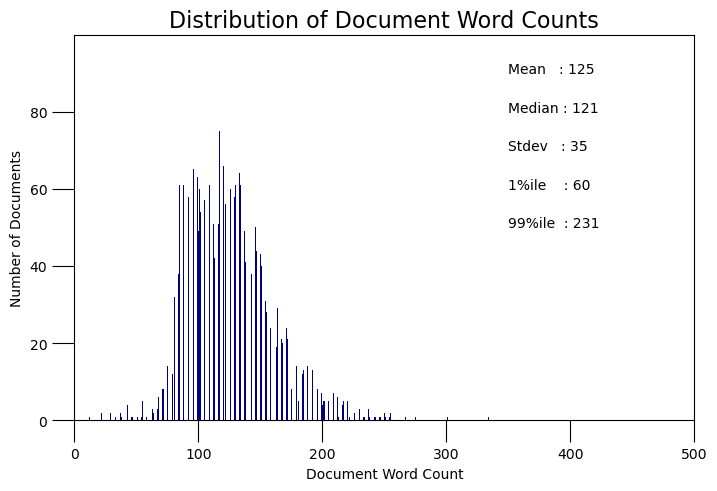

In [322]:
import numpy as np
doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(8,5), dpi=100)
plt.hist(doc_lens, bins = 1000, color='navy')
plt.text(350, 90, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(350,  80, "Median : " + str(round(np.median(doc_lens))))
plt.text(350,  70, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(350,  60, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(350,  50, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 100), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks([0, 100,200, 300, 400, 500])
plt.title('Distribution of Document Word Counts', fontdict=dict(size=16))
plt.show()

In [323]:
df_dominant_topic["Keywords"]

0       study, samples, quality, showed, activity, aci...
1       study, samples, quality, showed, activity, aci...
2       properties, antioxidant, content, showed, stud...
3       wines, extraction, method, wine, results, food...
4       method, study, '', ``, food, analysis, results...
                              ...                        
4989    food, study, properties, quality, different, s...
4990    study, mice, expression, microbiota, effects, ...
4991    study, mice, expression, microbiota, effects, ...
4992    study, mice, expression, microbiota, effects, ...
4993    study, samples, quality, showed, activity, aci...
Name: Keywords, Length: 4994, dtype: object

In [324]:
food_df["Keywords_LDA"] = df_dominant_topic["Keywords"]

In [328]:
food_df.to_csv("After_LDA.csv")

In [131]:
# dictionary_LDA = dictionary

# %matplotlib inline
# import pyLDAvis
# import pyLDAvis.gensim


# vis = pyLDAvis.gensim.prepare(topic_model=lda_model, corpus=corpus, dictionary=dictionary_LDA)
# pyLDAvis.enable_notebook()
# pyLDAvis.display(vis)

In [132]:
# pip install pandas==2.0.3 --user

In [133]:
print(pd. __version__)

2.0.3


In [134]:
for i,topic in lda_model.show_topics(formatted=True, num_topics=num_topics, num_words=10):
    print(str(i)+": "+ topic)
    print()

0: 0.007*"acid" + 0.007*"compounds" + 0.006*"tea" + 0.005*"study" + 0.004*"acids" + 0.004*"content" + 0.004*"total" + 0.003*"increased" + 0.003*"samples" + 0.003*"aroma"

1: 0.007*"study" + 0.006*"results" + 0.006*"activity" + 0.006*"antioxidant" + 0.005*"treatment" + 0.004*"samples" + 0.004*"total" + 0.004*"effects" + 0.004*"showed" + 0.004*"storage"

2: 0.007*"food" + 0.006*"samples" + 0.005*"method" + 0.005*"study" + 0.004*"results" + 0.004*"detection" + 0.004*"risk" + 0.004*"products" + 0.004*"content" + 0.003*"safety"

3: 0.014*"food" + 0.008*"oil" + 0.007*"acid" + 0.006*"compounds" + 0.005*"meat" + 0.005*"analysis" + 0.005*"study" + 0.004*"results" + 0.004*"acids" + 0.004*"different"

4: 0.004*"milk" + 0.004*"study" + 0.004*"fruit" + 0.004*"high" + 0.003*"showed" + 0.003*"effect" + 0.003*"results" + 0.003*"activity" + 0.003*"effects" + 0.003*"fish"

5: 0.011*"milk" + 0.008*"protein" + 0.007*"study" + 0.006*"analysis" + 0.005*"results" + 0.005*"acid" + 0.004*"different" + 0.004*"s

In [516]:
result_df

,Final_tokens,Topic_1,Topic_2,Topic_3,Topic_4,Topic_5,Topic_6,Topic_7,Topic_8,Topic_9,Topic_10
0,macrolepiota albuminosa berk pegler abundant a...,0.156916,0.520631,0.276895,0.037922,NaN,NaN,NaN,NaN,NaN,NaN
1,homogeneous galactoglucan purified alkali-extr...,0.791819,0.199898,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,homogeneous beta-glucan jhmp-70 obtained hypsi...,0.029582,0.218384,0.746055,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,novel dispersive micro-solid-phase extraction ...,0.404017,0.588258,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,yeast saccharomyces cerevisiae effective reduc...,0.140282,0.540177,0.139342,0.173305,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
4989,high moisture nutrient contents spiced beef po...,0.462533,0.294225,0.237637,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4990,inhibition salmonella lactobacillus popular re...,0.537611,0.012986,0.444046,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4991,lipid accumulation major factor development no...,0.564271,0.331989,0.097114,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4992,soybean milk economical substitute dairy produ...,0.032075,0.317483,0.379728,0.266196,NaN,NaN,NaN,NaN,NaN,NaN


In [135]:
# Retrieve the words corresponding to each topic
topic_words = []
for topic_id in range(num_topics):
    words = lda_model.get_topic_terms(topic_id, topn=10)  # Adjust 'topn' as needed
    topic_words.append([lda_model.id2word[word[0]] for word in words])

# # Assuming you have a DataFrame named 'result_df' containing the abstracts and topic columns
# for i, row in result_df.iterrows():
# #     abstract = row['abstract']
#     topic1_word = topic_words[0]
#     topic2_word = topic_words[1]
#     topic1 = row['Topic_1']
#     topic2 = row['Topic_2']

In [136]:
topic_words

[['acid',
  'compounds',
  'tea',
  'study',
  'acids',
  'content',
  'total',
  'increased',
  'samples',
  'aroma'],
 ['study',
  'results',
  'activity',
  'antioxidant',
  'treatment',
  'samples',
  'total',
  'effects',
  'showed',
  'storage'],
 ['food',
  'samples',
  'method',
  'study',
  'results',
  'detection',
  'risk',
  'products',
  'content',
  'safety'],
 ['food',
  'oil',
  'acid',
  'compounds',
  'meat',
  'analysis',
  'study',
  'results',
  'acids',
  'different'],
 ['milk',
  'study',
  'fruit',
  'high',
  'showed',
  'effect',
  'results',
  'activity',
  'effects',
  'fish'],
 ['milk',
  'protein',
  'study',
  'analysis',
  'results',
  'acid',
  'different',
  'samples',
  'increased',
  'method'],
 ['drying',
  'fruit',
  'quality',
  'study',
  '``',
  "''",
  'results',
  'treatment',
  'food',
  'genes'],
 ['°c',
  'study',
  'showed',
  'drying',
  'results',
  'properties',
  'different',
  'quality',
  'effect',
  'time'],
 ['l.',
  'acid',
  'pro

In [2]:
import pandas as pd

In [506]:
result_df

,Final_tokens,Topic_1,Topic_2
0,macrolepiota albuminosa berk pegler abundant a...,0.833515,0.166485
1,homogeneous galactoglucan purified alkali-extr...,0.981652,0.018348
2,homogeneous beta-glucan jhmp-70 obtained hypsi...,0.926791,0.073209
3,novel dispersive micro-solid-phase extraction ...,0.125421,0.874579
4,yeast saccharomyces cerevisiae effective reduc...,0.894104,0.105896
...,...,...,...
4989,high moisture nutrient contents spiced beef po...,0.992902,NaN
4990,inhibition salmonella lactobacillus popular re...,0.995393,NaN
4991,lipid accumulation major factor development no...,0.993809,NaN
4992,soybean milk economical substitute dairy produ...,0.993094,NaN


In [485]:
result_df.to_csv("AB_LDA.csv")

In [492]:
result_df

,Final_tokens,Topic_1,Topic_2
0,macrolepiota albuminosa berk pegler abundant a...,0.833515,0.166485
1,homogeneous galactoglucan purified alkali-extr...,0.981652,0.018348
2,homogeneous beta-glucan jhmp-70 obtained hypsi...,0.926791,0.073209
3,novel dispersive micro-solid-phase extraction ...,0.125421,0.874579
4,yeast saccharomyces cerevisiae effective reduc...,0.894104,0.105896
...,...,...,...
4989,high moisture nutrient contents spiced beef po...,0.992902,NaN
4990,inhibition salmonella lactobacillus popular re...,0.995393,NaN
4991,lipid accumulation major factor development no...,0.993809,NaN
4992,soybean milk economical substitute dairy produ...,0.993094,NaN


In [514]:
lda_model[corpus[0]] 

[(1, 0.15707722), (4, 0.5208514), (7, 0.27651203), (8, 0.037923448)]

NameError: name 'dictionary_LDA' is not defined

In [487]:
topics = lda_model.show_topics(num_topics=num_topics, formatted=False)

for topic_id, topic_terms in topics:
    print(f"Topic {topic_id + 1}:")
    for term, weight in topic_terms:
        print(f"- {term}: {weight}")
    print()

Topic 1:
- study: 0.005988894961774349
- showed: 0.005026763305068016
- results: 0.004523431416600943
- increased: 0.004122706595808268
- content: 0.003986545372754335
- acid: 0.003843932645395398
- effect: 0.0036906313616782427
- properties: 0.0035439985804259777
- treatment: 0.0034085216466337442
- different: 0.003407637355849147

Topic 2:
- food: 0.005795558914542198
- study: 0.00533093698322773
- results: 0.004359387792646885
- samples: 0.004186148289591074
- milk: 0.0040534124709665775
- analysis: 0.0035704495385289192
- different: 0.0032227053306996822
- acid: 0.003209684742614627
- products: 0.0032041233498603106
- quality: 0.0030928582418709993



In [257]:
# paper_with_aims_ti = df["TI"].unique().tolist()

# for i in food_df.index:
#     if i<3 :
#         print(food_df.loc[i,"TI"])
#         print(paper_with_aims_ti[i])
#         if food_df.loc[i,"TI"] == paper_with_aims_ti[i]: 
#             print("Match")
#     else: 
#         break
            

In [262]:
doc = nlp(food_df_ind[food_df_ind['Check_Aim'] == 1].iloc[1,3])
for token in doc:
    print(token.text,'->',token.pos_)
# displacy.render(doc, style='dep',jupyter=True)

Its -> PRON
fine -> ADJ
structure -> NOUN
was -> AUX
investigated -> VERB
by -> ADP
FT -> PROPN
- -> PUNCT
IR -> PROPN
methylation -> NOUN
combined -> VERB
with -> ADP
GC -> PROPN
- -> PUNCT
MS -> PROPN
and -> CCONJ
1D -> NOUN
and -> CCONJ
2D -> NOUN
NMR -> PROPN
analysis -> NOUN
. -> PUNCT


In [303]:
import urllib
from string import punctuation
import nltk
import json

# ENTITY_TYPES = ["human", "person", "company", "enterprise", "business", "geographic region",
#                 "human settlement", "geographic entity", "territorial entity type", "organization"]

ENTITY_TYPES = ["food chemistry", "food hydrocolloids", "food analytical methods", "food biochemistry", "food science and technology", "food quality and preference", 
                "food function", "functional foods", "food microbiology", "food processing", "food policy", "food science", "cereal science", 
                "food composition and analysis", "dairy science", "food bioscience", "food control", "postharvest biology and technology", 
                "food science and biotechnology", "meat science", "food safety", "foodborne pathogens", "plant foods", 
                "toxins", "nutrition", "food additives", "brewing chemists", "food engineering", "food technology", "mycotoxin journal"]


def wikifier(text, lang="en", threshold=0.8):
    """Function that fetches entity linking results from wikifier.com API"""
    # Prepare the URL.
    data = urllib.parse.urlencode([
        ("text", text), ("lang", lang),
        ("userKey", "tgbdmkpmkluegqfbawcwjywieevmza"),
        ("pageRankSqThreshold", "%g" %
         threshold), ("applyPageRankSqThreshold", "true"),
        ("nTopDfValuesToIgnore", "100"), ("nWordsToIgnoreFromList", "100"),
        ("wikiDataClasses", "true"), ("wikiDataClassIds", "false"),
        ("support", "true"), ("ranges", "false"), ("minLinkFrequency", "2"),
        ("includeCosines", "false"), ("maxMentionEntropy", "3")
    ])
    url = "http://www.wikifier.org/annotate-article"
    # Call the Wikifier and read the response.
    req = urllib.request.Request(url, data=data.encode("utf8"), method="POST")
    with urllib.request.urlopen(req, timeout=60) as f:
        response = f.read()
        response = json.loads(response.decode("utf8"))
    # Output the annotations.
    results = list()
    for annotation in response["annotations"]:
        # Filter out desired entity classes
        if ('wikiDataClasses' in annotation) and (any([el['enLabel'] in ENTITY_TYPES for el in annotation['wikiDataClasses']])):

            # Specify entity label
            if any([el['enLabel'] in ["human", "person"] for el in annotation['wikiDataClasses']]):
                label = 'Person'
            elif any([el['enLabel'] in ["company", "enterprise", "business", "organization"] for el in annotation['wikiDataClasses']]):
                label = 'Organization'
            elif any([el['enLabel'] in ["geographic region", "human settlement", "geographic entity", "territorial entity type"] for el in annotation['wikiDataClasses']]):
                label = 'Location'
            else:
                label = None

            results.append({'title': annotation['title'], 'wikiId': annotation['wikiDataItemId'], 'label': label,
                            'characters': [(el['chFrom'], el['chTo']) for el in annotation['support']]})
    return results


# First get all the entities in the sentence
entities = wikifier(food_df["AB_Clean"][0])

In [304]:
entities

In [305]:
entities

[]

Analysing Authors

In [5]:
food_df_authors = food_df.explode("AU")
food_df_authors

,AU,SO,TI,AB
0,Yu-Xiao Wang,Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
0,Yue Xin,Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
0,Jun-Yi Yin,Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
0,Xiao-Jun Huang,Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
0,Jun-Qiao Wang,Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
...,...,...,...,...
4999,Dan Huang,Journal of Food Process Engineering,Microwave intermittent drying characteristics ...,This paper reports on an experimental investig...
4999,Kaiyang Men,Journal of Food Process Engineering,Microwave intermittent drying characteristics ...,This paper reports on an experimental investig...
4999,Xiaohong Tang,Journal of Food Process Engineering,Microwave intermittent drying characteristics ...,This paper reports on an experimental investig...
4999,Wei Li,Journal of Food Process Engineering,Microwave intermittent drying characteristics ...,This paper reports on an experimental investig...


In [6]:
food_df_authors.loc[0]

,AU,SO,TI,AB
0,Yu-Xiao Wang,Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
0,Yue Xin,Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
0,Jun-Yi Yin,Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
0,Xiao-Jun Huang,Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
0,Jun-Qiao Wang,Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
0,Jie-Lun Hu,Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
0,Fang Geng,Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
0,Shao-Ping Nie,Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...


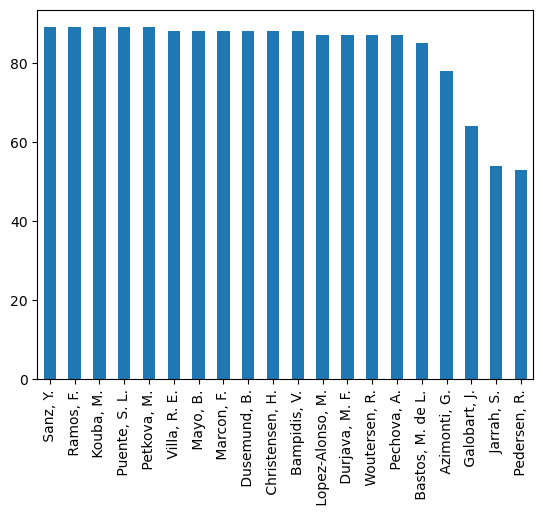

In [7]:
author_count = food_df_authors["AU"].value_counts()
top_authors = author_count.nlargest(20).plot.bar()

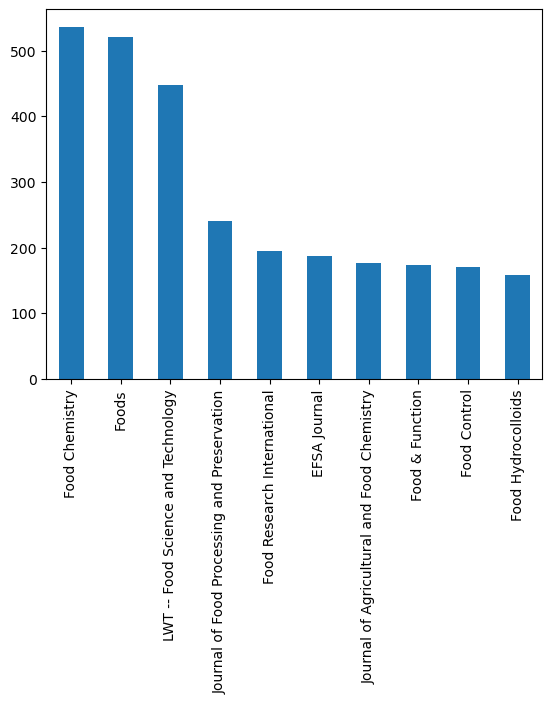

In [8]:
journal_name_count = food_df["SO"].value_counts()
top_journals = journal_name_count.nlargest(10).plot.bar()

In [9]:
food_df

,AU,SO,TI,AB
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...
1,"[Yu-Xiao Wang, Yue Xin, Xiao-Jun Huang, Jun...",Food Chemistry,A branched galactoglucan with flexible chains ...,A homogeneous galactoglucan was purified from ...
2,"[Yu-Xiao Wang, Ting Zhang, Jun-Yi Yin, Xiao...",Food Hydrocolloids,Structural characterization and rheological pr...,A homogeneous beta-glucan (JHMP-70) was obtain...
3,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,A novel dispersive micro-solid-phase extractio...
4,"[Yu-Xue Xu, Ze-Dong Jiang, Xi-Ping Du, Ming...",Food Chemistry,The identification of biotransformation pathwa...,The yeast Saccharomyces cerevisiae is effectiv...
...,...,...,...,...
4995,"[Dan Hai, Xianqing Huang, Lianjun Song]",Food Science & Nutrition,Effects of different modified atmosphere treat...,The high moisture and nutrient contents of spi...
4996,"[Dan Hai, Zhaoxin Lu, Xianqing Huang, Fengx...",Foods,In vitro screening of chicken-derived Lactobac...,Inhibition of Salmonella by Lactobacillus has ...
4997,"[Dan He, Liping Yan, Jiaqi Zhang, Fang Li, ...",Food Science & Nutrition,Sargassum fusiforme polysaccharide attenuates ...,Lipid accumulation is a major factor in the de...
4998,"[Dan Hu, Jinyong Wu, Long Jin, Lixia Yuan, ...",Food Research International,Evaluation of Pediococcus pentosaceus strains ...,Soybean milk is an economical substitute for d...


#### What can we do? : 

1. Clustering - Which articles are very closer to each other (Similar to Amazon Book Clustering). 
Clustering is also unsupervised entirely – its often more useful to take examples and try to learn pre-defined groups (more semi-supervised).  **Semi-Supervised Clustering with Topic** 
2. IR - Any random text - Which book may have generated that string ? (Lecture 3 Pg. 45) - Using document language modeling 
3. Information Extraction: 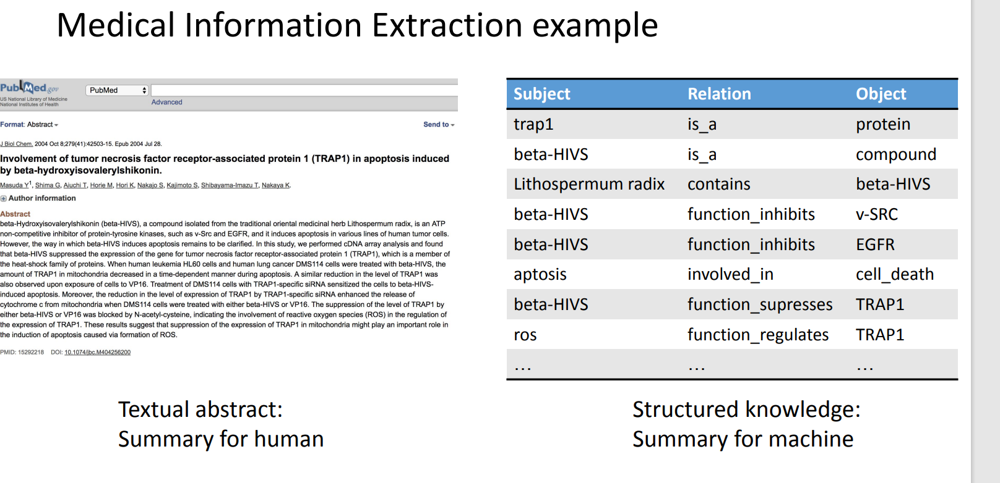 



'A novel enzyme-catalyzed method was developed for the synthesis of phytosterol polyol esters from beta-sitosterol and polyols (sorbitol, mannitol and xylitol) by two-step transesterification using divinyl adipate (DVA) as a link. A high conversion (exceeding 94%) of beta-sitosterol with a vinyl group was achieved, in the presence of Candida rugosa lipase (CRL), at low temperature (35 °C) within 30 min. Subsequently, the maximum conversion of phytosterol polyol esters (>94%) was obtained using alkaline protease from Bacillus subtilis at 65 °C. Phytosterol polyol esters had enhanced thermal stability (up to an above 355 °C) and excellent water solubility (4.6-7.9 mM at 35 °C). Moreover, obvious increases in the bioaccessibility (41.5-63.6%) and intestinal uptake (5.2-6.5%) were observed using a simulated gastrointestinal digestion/Caco-2 cell model. These results highlighted the key role of hydrophilic structural modifications on physicochemical properties and absorption of phytosterols

Perform text preprocessing:
Tokenization: Break down the text into individual words or tokens.
Remove stopwords: Eliminate common words that do not carry much meaning.
Lemmatization: Reduce words to their base or root form.

In [30]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.sentiment import SentimentIntensityAnalyzer

In [34]:
stop_words = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

def preprocess_text(text):
    tokens = word_tokenize(text.lower())  # Tokenization
    tokens = [lemmatizer.lemmatize(token) for token in tokens if token.isalpha()]  # Lemmatization
    tokens = [token for token in tokens if token not in stop_words]  # Remove stopwords
    return tokens

food_df['Processed Abstract'] = food_df["AB"].astype(str).apply(preprocess_text)

In [67]:
food_df.iloc[0]["AB"]

'Macrolepiota albuminosa (Berk.) Pegler is abundant in active polysaccharides, but little is known about their structures and solution properties. In this study, water-extracted polysaccharides from M. albuminosa (MAWP) were purified into three fractions with structural heterogeneity, which was attributed to the diversity in molecular weight, monosaccharide composition and linkage patterns, further affecting their solution properties. Methylation and NMR analysis revealed MAWP-60p and MAWP-70 were a 3-O-methylated glucomannogalactan and a previously unreported glucomannogalactan, whereas MAWP-80 was elucidated as a branched galactoglucan. Besides, three fractions exhibited random coil conformation in aqueous solution, while MAWP-60p had the highest viscosity due to its highest molecular weight, mean square radius of gyration (Rg) and O-methyl group attached to the backbone. The molecular weight, monosaccharide composition and glycosidic linkages might be the major contributors to the f

In [65]:
preprocess_text(food_df.iloc[0]["AB"])

['macrolepiota',
 'albuminosa',
 'berk',
 'pegler',
 'abundant',
 'active',
 'polysaccharide',
 'little',
 'known',
 'structure',
 'solution',
 'property',
 'study',
 'polysaccharide',
 'albuminosa',
 'mawp',
 'purified',
 'three',
 'fraction',
 'structural',
 'heterogeneity',
 'wa',
 'attributed',
 'diversity',
 'molecular',
 'weight',
 'monosaccharide',
 'composition',
 'linkage',
 'pattern',
 'affecting',
 'solution',
 'property',
 'methylation',
 'nmr',
 'analysis',
 'revealed',
 'glucomannogalactan',
 'previously',
 'unreported',
 'glucomannogalactan',
 'whereas',
 'wa',
 'elucidated',
 'branched',
 'galactoglucan',
 'besides',
 'three',
 'fraction',
 'exhibited',
 'random',
 'coil',
 'conformation',
 'aqueous',
 'solution',
 'highest',
 'viscosity',
 'due',
 'highest',
 'molecular',
 'weight',
 'mean',
 'square',
 'radius',
 'gyration',
 'rg',
 'group',
 'attached',
 'backbone',
 'molecular',
 'weight',
 'monosaccharide',
 'composition',
 'glycosidic',
 'linkage',
 'might',
 'maj

In [38]:
food_df['Processed Abstract'][0]

['macrolepiota',
 'albuminosa',
 'berk',
 'pegler',
 'abundant',
 'active',
 'polysaccharide',
 'little',
 'known',
 'structure',
 'solution',
 'property',
 'study',
 'polysaccharide',
 'albuminosa',
 'mawp',
 'purified',
 'three',
 'fraction',
 'structural',
 'heterogeneity',
 'wa',
 'attributed',
 'diversity',
 'molecular',
 'weight',
 'monosaccharide',
 'composition',
 'linkage',
 'pattern',
 'affecting',
 'solution',
 'property',
 'methylation',
 'nmr',
 'analysis',
 'revealed',
 'glucomannogalactan',
 'previously',
 'unreported',
 'glucomannogalactan',
 'whereas',
 'wa',
 'elucidated',
 'branched',
 'galactoglucan',
 'besides',
 'three',
 'fraction',
 'exhibited',
 'random',
 'coil',
 'conformation',
 'aqueous',
 'solution',
 'highest',
 'viscosity',
 'due',
 'highest',
 'molecular',
 'weight',
 'mean',
 'square',
 'radius',
 'gyration',
 'rg',
 'group',
 'attached',
 'backbone',
 'molecular',
 'weight',
 'monosaccharide',
 'composition',
 'glycosidic',
 'linkage',
 'might',
 'maj

In [39]:
sia = SentimentIntensityAnalyzer()

def get_sentiment_score(text):
    sentiment = sia.polarity_scores(' '.join(text))
    return sentiment['compound']

food_df['Sentiment Score'] = food_df['Processed Abstract'].apply(get_sentiment_score)

In [40]:
food_df

,AU,SO,TI,AB,Processed Abstract,Sentiment Score
0,"[Yu-Xiao Wang, Yue Xin, Jun-Yi Yin, Xiao-Ju...",Food Chemistry,Revealing the architecture and solution proper...,Macrolepiota albuminosa (Berk.) Pegler is abun...,"[macrolepiota, albuminosa, berk, pegler, abund...",0.8485
1,"[Yu-Xiao Wang, Yue Xin, Xiao-Jun Huang, Jun...",Food Chemistry,A branched galactoglucan with flexible chains ...,A homogeneous galactoglucan was purified from ...,"[homogeneous, galactoglucan, wa, purified, pol...",0.0000
2,"[Yu-Xiao Wang, Ting Zhang, Jun-Yi Yin, Xiao...",Food Hydrocolloids,Structural characterization and rheological pr...,A homogeneous beta-glucan (JHMP-70) was obtain...,"[homogeneous, wa, obtained, hypsizygus, marmor...",0.6808
3,"[Yu-Xin Gu, Tian-Ci Yan, Zi-Xuan Yue, Min-H...",Food Analytical Methods,Dispersive micro-solid-phase extraction of aca...,A novel dispersive micro-solid-phase extractio...,"[novel, dispersive, extraction, dmspe, method,...",0.9801
4,"[Yu-Xue Xu, Ze-Dong Jiang, Xi-Ping Du, Ming...",Food Chemistry,The identification of biotransformation pathwa...,The yeast Saccharomyces cerevisiae is effectiv...,"[yeast, saccharomyces, cerevisiae, effective, ...",0.7351
...,...,...,...,...,...,...
4995,"[Dan Hai, Xianqing Huang, Lianjun Song]",Food Science & Nutrition,Effects of different modified atmosphere treat...,The high moisture and nutrient contents of spi...,"[high, moisture, nutrient, content, spiced, be...",0.2732
4996,"[Dan Hai, Zhaoxin Lu, Xianqing Huang, Fengx...",Foods,In vitro screening of chicken-derived Lactobac...,Inhibition of Salmonella by Lactobacillus has ...,"[inhibition, salmonella, lactobacillus, ha, po...",-0.4215
4997,"[Dan He, Liping Yan, Jiaqi Zhang, Fang Li, ...",Food Science & Nutrition,Sargassum fusiforme polysaccharide attenuates ...,Lipid accumulation is a major factor in the de...,"[lipid, accumulation, major, factor, developme...",0.4215
4998,"[Dan Hu, Jinyong Wu, Long Jin, Lixia Yuan, ...",Food Research International,Evaluation of Pediococcus pentosaceus strains ...,Soybean milk is an economical substitute for d...,"[soybean, milk, economical, substitute, dairy,...",0.9001


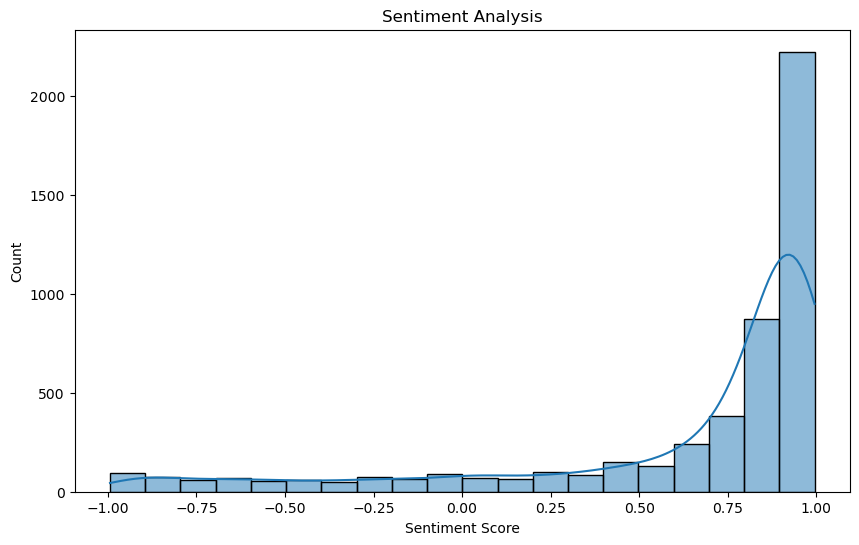

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.histplot(food_df['Sentiment Score'], bins=20, kde=True)
plt.title('Sentiment Analysis')
plt.xlabel('Sentiment Score')
plt.ylabel('Count')
plt.show()

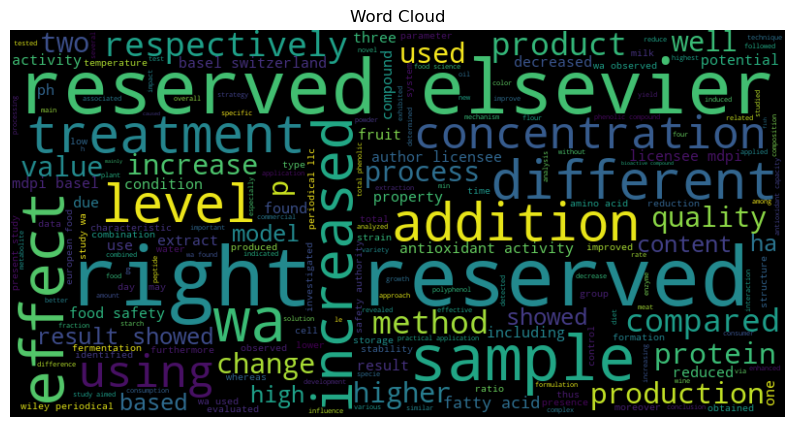

In [49]:
from wordcloud import WordCloud
all_words = ' '.join(food_df['Processed Abstract'].apply(' '.join))
wordcloud = WordCloud(width=800, height=400).generate(all_words)
plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud')
plt.show()

In [35]:
# Spacy

In [10]:
import spacy
nlp = spacy.load('en_core_web_sm')
doc = nlp(food_df.iloc[0]["AB"])

In [13]:
nlp = spacy.load('en_core_web_sm')
doc = nlp(food_df.iloc[0]["AB"])


In [14]:
for token in doc[:30]:
    print("{0}\t{1}\t{2}\t{3}\t{4}".format(
        token.text,
        token.idx,
        token.lemma_,
        token.is_punct,
        token.is_space,
    ))

Macrolepiota	0	Macrolepiota	False	False
albuminosa	13	albuminosa	False	False
(	24	(	True	False
Berk	25	Berk	False	False
.	29	.	True	False
)	30	)	True	False
Pegler	32	Pegler	False	False
is	39	be	False	False
abundant	42	abundant	False	False
in	51	in	False	False
active	54	active	False	False
polysaccharides	61	polysaccharide	False	False
,	76	,	True	False
but	78	but	False	False
little	82	little	False	False
is	89	be	False	False
known	92	know	False	False
about	98	about	False	False
their	104	their	False	False
structures	110	structure	False	False
and	121	and	False	False
solution	125	solution	False	False
properties	134	property	False	False
.	144	.	True	False
In	146	in	False	False
this	149	this	False	False
study	154	study	False	False
,	159	,	True	False
water	161	water	False	False
-	166	-	True	False


In [15]:
def spacy_tokenize(string):
    tokens = list()
    doc = nlp(string)
    for token in doc:
        tokens.append(token)
    return tokens

In [18]:
food_df["AB"]

0       Macrolepiota albuminosa (Berk.) Pegler is abun...
1       A homogeneous galactoglucan was purified from ...
2       A homogeneous beta-glucan (JHMP-70) was obtain...
3       A novel dispersive micro-solid-phase extractio...
4       The yeast Saccharomyces cerevisiae is effectiv...
                              ...                        
4995    The high moisture and nutrient contents of spi...
4996    Inhibition of Salmonella by Lactobacillus has ...
4997    Lipid accumulation is a major factor in the de...
4998    Soybean milk is an economical substitute for d...
4999    This paper reports on an experimental investig...
Name: AB, Length: 5000, dtype: object

In [24]:
all_posts_tokenized = food_df["AB"].astype(str).apply(spacy_tokenize)

import itertools
# A single variable with the (flattened) tokens from all posts.
flat_tokens = list(itertools.chain.from_iterable(all_posts_tokenized))

In [25]:
flat_tokens

[Macrolepiota,
 albuminosa,
 (,
 Berk,
 .,
 ),
 Pegler,
 is,
 abundant,
 in,
 active,
 polysaccharides,
 ,,
 but,
 little,
 is,
 known,
 about,
 their,
 structures,
 and,
 solution,
 properties,
 .,
 In,
 this,
 study,
 ,,
 water,
 -,
 extracted,
 polysaccharides,
 from,
 M.,
 albuminosa,
 (,
 MAWP,
 ),
 were,
 purified,
 into,
 three,
 fractions,
 with,
 structural,
 heterogeneity,
 ,,
 which,
 was,
 attributed,
 to,
 the,
 diversity,
 in,
 molecular,
 weight,
 ,,
 monosaccharide,
 composition,
 and,
 linkage,
 patterns,
 ,,
 further,
 affecting,
 their,
 solution,
 properties,
 .,
 Methylation,
 and,
 NMR,
 analysis,
 revealed,
 MAWP-60p,
 and,
 MAWP-70,
 were,
 a,
 3,
 -,
 O,
 -,
 methylated,
 glucomannogalactan,
 and,
 a,
 previously,
 unreported,
 glucomannogalactan,
 ,,
 whereas,
 MAWP-80,
 was,
 elucidated,
 as,
 a,
 branched,
 galactoglucan,
 .,
 Besides,
 ,,
 three,
 fractions,
 exhibited,
 random,
 coil,
 conformation,
 in,
 aqueous,
 solution,
 ,,
 while,
 MAWP-60p,
 had,
 t

In [26]:
import collections
raw_words = [t.text for t in flat_tokens]
raw_count = collections.Counter(raw_words)
raw_count.most_common(50)

[(',', 63040),
 ('the', 50615),
 ('.', 49371),
 ('and', 45357),
 ('of', 43262),
 ('-', 28365),
 ('(', 23573),
 (')', 23541),
 ('in', 20500),
 ('to', 18693),
 ('a', 11587),
 ('The', 11417),
 ('were', 10047),
 ('was', 9810),
 ('for', 9719),
 ('with', 9548),
 ('by', 7802),
 ('%', 7201),
 ('that', 6881),
 ('on', 6373),
 ('as', 5870),
 ('/', 5079),
 ('is', 4978),
 ('from', 4705),
 ('study', 3808),
 ('at', 3697),
 ('be', 3481),
 ('this', 3108),
 ('In', 2977),
 ('food', 2929),
 ('an', 2643),
 ('All', 2605),
 ('showed', 2579),
 ('acid', 2525),
 ('content', 2476),
 ('results', 2442),
 ('are', 2435),
 ('rights', 2365),
 ('reserved', 2361),
 ('Elsevier', 2347),
 ('©', 2323),
 ('samples', 2255),
 ('used', 2195),
 ('high', 2194),
 ('which', 2174),
 ('different', 2106),
 ('properties', 2097),
 ('protein', 2031),
 ('C', 2018),
 ('This', 1996)]

In [28]:
#@title
def normalize(tokens):
  normalized = list()
  for token in tokens:
    if (token.is_alpha):
      lemma = token.lemma_.lower().strip() if token.lemma_ != "-PRON-" else token.lower_
      normalized.append(lemma)
  return normalized

In [27]:
normalized_tokens = normalize(flat_tokens)

NameError: name 'normalize' is not defined

In [4]:
# food_df.shape

In [5]:
# columns_with_all_na = food_df.columns[food_df.isna().all()]
# print("Columns with only NA values:", columns_with_all_na.tolist(), len(columns_with_all_na))

In [6]:
# food_df.drop(columns = columns_with_all_na,inplace = True)
# food_df.shape

In [7]:
# food_df.head(2)

In [8]:
# print(food_df["PT"].value_counts())
# food_df.drop(columns = ["PT"],inplace = True)
# food_df.head(2)

In [9]:
# food_df.head(2)

In [10]:
# food_df.isna().sum()

In [11]:
# food_df[["AU", "TI", "SO", "AB", "PY", "VL", "SN", "DI", "UT"]].head(3)

In [12]:
# food_df.dtypes

In [13]:
# my_string = food_df["AU"][0]
# mylist = my_string.split(";")

In [14]:
# food_df.loc[1351, "AU"]

In [15]:
# for i in food_df.index: 
#     my_string = food_df.loc[i,"AU"]
#     if pd.isna(my_string): 
#         mylist = 0
#     else: 
#         mylist = my_string.split(";")
#     food_df.at[i,"AU"] = mylist

In [16]:
# food_df

In [17]:
# food_df["TI"].describe()

In [18]:
# food_df["SO"].value_counts()

In [19]:
# food_df["AB"][0]

In [20]:
# food_df["PY"].value_counts()

In [21]:
# food_df["VL"]

In [22]:
# food_df.index

In [23]:
# food_df.loc[563,"AU"]

In [24]:
# food_df[pd.notnull(food_df["AA"])]

In [25]:
# food_df[pd.notnull(food_df["ED"])]